<font size="+2">Pairs Trading Strategy Design and Backtest (TS)</font>

<font size="+1">Julien Granger, June 2022 CQF Cohort</font>

In this notebook, I go through the following steps:
- load energy futures, 
- form cointegrated pairs, 
- identify the ones with the shortest half-lives, 
- backtest their pnl and plot their Sharpe ratio and max dd for various Z values (bounds)

In [1]:
import matplotlib.pyplot as plt
import LoadEnergyFutures
import MyPair
import Backtest
import Utilities
import pandas as pd
import pyfolio as pf
import numpy as np

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


# Load Data

In [2]:
import LoadEnergyFutures
df = LoadEnergyFutures.load_ef()

In [3]:
df['NG'].describe().T

,count,mean,std,min,25%,50%,75%,max
NGHenry,6137.0,3.965174,2.388033,1.020,2.1600,3.340,5.2700,15.390
NNGC1,8379.0,3.841035,2.225178,1.075,2.2570,3.037,4.7725,15.378
NNGC2,8379.0,3.915046,2.268950,1.100,2.2845,3.102,4.8630,15.427
NNGC3,8379.0,3.967820,2.303717,1.125,2.2990,3.168,4.8975,15.287
NNGC4,8379.0,3.996857,2.311116,1.145,2.3220,3.210,4.9120,14.906
NNGC5,8379.0,4.015884,2.322130,1.165,2.3320,3.230,4.9300,14.665
NNGC6,8379.0,4.026948,2.320480,1.185,2.3450,3.242,4.8865,14.516
NNGC7,8379.0,4.036034,2.318934,1.195,2.3475,3.262,4.9325,14.446
NNGC8,8379.0,4.040378,2.314483,1.245,2.3400,3.276,4.9935,14.166
NNGC9,8379.0,4.042371,2.303827,1.300,2.3365,3.246,5.0060,13.887


<AxesSubplot: xlabel='Date'>

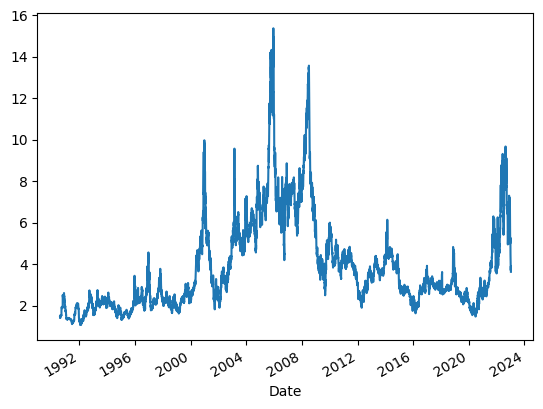

In [4]:
df['NG'].NNGC1.plot()

In [5]:
# to bbl need to divide by 172.4
# df['NG'] = df['NG']/172.4
# df['NG'].NNGC1.plot()

In [6]:
df['CR'].describe().T

,count,mean,std,min,25%,50%,75%,max
RCLC1,8696.0,49.193811,29.455038,10.01,21.5075,44.000,70.7025,145.29
RCLC2,8696.0,49.301181,29.479102,11.02,21.3100,44.830,71.1400,145.86
RCLC3,8696.0,49.330231,29.481847,11.33,21.2200,45.465,71.1425,146.13
RCLC4,8696.0,49.304691,29.472147,11.61,21.1000,45.870,71.0625,146.43
RCLC5,8696.0,49.251909,29.454751,11.88,20.9600,46.100,71.1175,146.68
RCLC6,8696.0,49.178949,29.428743,12.06,20.8500,46.390,71.1425,146.85
RCLC12,8696.0,48.631927,29.182250,12.81,20.3600,46.505,71.2625,146.32
LLCC1,8696.0,51.013896,32.947084,9.64,19.9900,44.955,72.9925,146.08
LLCC2,8696.0,50.942038,32.836240,9.91,19.8100,45.585,73.1025,146.60
LLCC3,8696.0,50.893268,32.758001,10.16,19.7400,46.040,73.2525,147.05


In [7]:
df['CR'].tail()

,RCLC1,RCLC2,RCLC3,RCLC4,RCLC5,RCLC6,RCLC12,LLCC1,LLCC2,LLCC3,LLCC4,LLCC5,LLCC6,LLCC12
Date,,,,,,,,,,,,,,
2023-01-04,72.84,73.10,73.33,73.51,73.56,73.48,71.97,77.84,78.01,78.01,77.88,77.67,77.39,75.65
2023-01-05,73.67,73.92,74.14,74.30,74.34,74.25,72.61,78.69,78.82,78.80,78.66,78.43,78.15,76.25
2023-01-06,73.77,74.04,74.26,74.44,74.50,74.43,72.80,78.57,78.75,78.74,78.62,78.42,78.17,76.44
2023-01-09,74.63,74.92,75.17,75.39,75.49,75.45,73.82,79.65,79.89,79.89,79.78,79.59,79.34,77.62
2023-01-10,75.12,75.37,75.60,75.77,75.83,75.75,73.91,80.10,80.28,80.25,80.08,79.83,79.54,77.59


<AxesSubplot: xlabel='Date'>

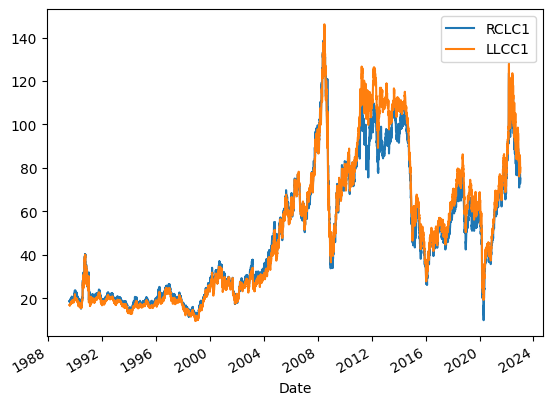

In [8]:
df['CR'][['RCLC1','LLCC1']].plot()

<AxesSubplot: xlabel='Date'>

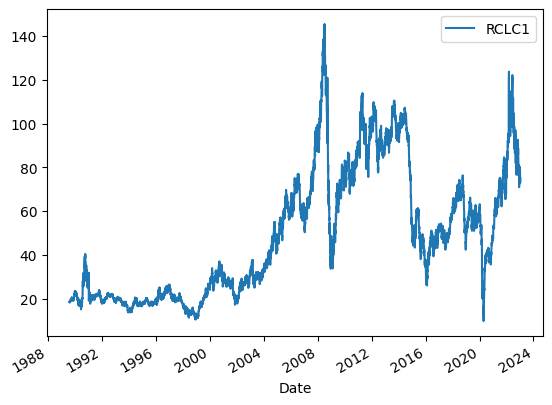

In [9]:
df['CR'][['RCLC1']].plot()

In [10]:
df['RB'].describe().T

,count,mean,std,min,25%,50%,75%,max
RBC1,4429.0,88.945236,26.848030,17.2956,67.5822,85.9068,111.1236,179.6004
RBC2,4429.0,88.493031,25.955886,20.7774,67.9350,85.3356,110.0358,171.5238
RBC3,4429.0,88.172510,25.090277,22.9950,68.5608,84.9996,109.2924,163.4472
RBC4,4429.0,87.958404,24.249079,25.0614,69.4344,84.2478,109.3512,151.4772
RBC5,4429.0,87.673755,23.589839,27.0060,69.9594,83.0676,109.3848,147.6174
RBC6,4429.0,87.433738,23.087828,27.1824,71.0640,82.3914,108.9648,148.5834
RBC7,4429.0,87.179916,22.742857,27.1110,71.0724,82.4502,108.6078,149.5494
RBC8,4429.0,87.027339,22.546907,27.9384,70.0602,83.4666,108.0828,150.9144
RBC9,4429.0,86.845939,22.481608,28.8414,69.6822,84.2226,107.4108,157.6344
RBC10,4429.0,86.610718,22.468850,29.7360,68.9388,85.8270,106.6002,157.8024


<AxesSubplot: xlabel='Date'>

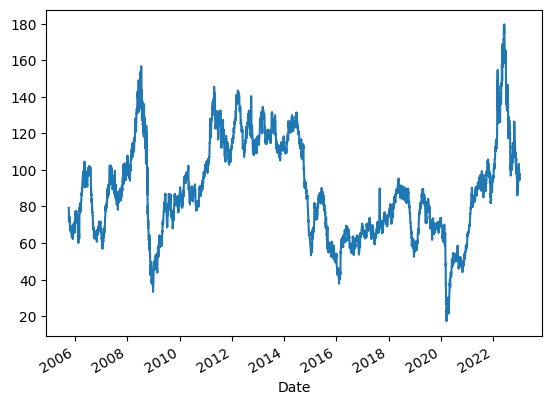

In [11]:
df['RB'].RBC1.plot()

In [12]:
df['HO'].describe().T

,count,mean,std,min,25%,50%,75%,max
HOTC1,9582.0,57.885219,39.652120,12.3984,23.07060,42.4536,83.73435,215.6868
HOTC2,9582.0,57.803936,39.377501,12.6462,22.94460,42.0021,84.40740,185.5602
HOTC3,9582.0,57.786041,39.260457,12.9192,22.94145,41.8887,84.87255,180.6882
HOTC4,9582.0,57.757001,39.180382,13.1922,22.92885,41.5065,85.30515,176.9040
HOTC5,9582.0,57.715470,39.112763,13.5492,22.90470,40.9416,85.67055,178.2060
HOTC6,9582.0,57.665124,39.042101,13.9272,22.93620,41.3469,85.89735,179.2140
HOTC7,9582.0,57.613602,38.969004,14.3472,23.01180,42.0021,86.00445,179.5500
HOTC8,9582.0,57.555882,38.889652,13.9650,22.94040,42.2373,86.05800,178.7100
HOTC9,9582.0,57.498413,38.804639,13.3980,22.86900,41.5548,86.25645,176.8830
HOTC10,9582.0,72.905814,53.953493,15.4602,24.86925,66.4251,99.09165,237.0900


<AxesSubplot: xlabel='Date'>

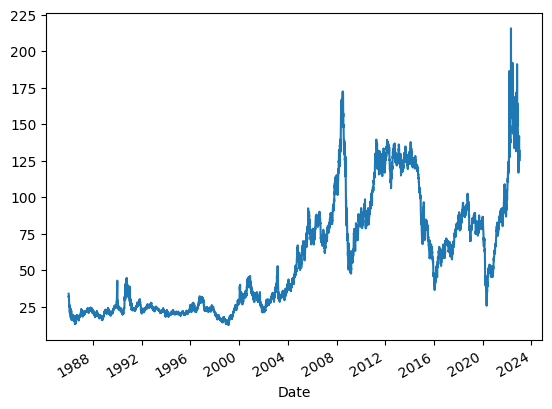

In [13]:
df['HO']['HOTC1'].plot()

In [14]:
df['GO'].describe().T

,count,mean,std,min,25%,50%,75%,max
GOC1,5297.0,84.068635,33.096523,25.168011,61.122312,79.099462,112.802419,204.637097
GOC2,5297.0,83.898873,32.475708,26.612903,61.357527,79.301075,112.197581,179.267473
GOC3,5297.0,83.837048,32.058091,26.478495,61.727151,79.670699,111.290323,180.174731
GOC4,5297.0,83.797540,31.740015,26.377688,62.063172,79.973118,110.551075,180.678763
GOC5,5297.0,83.781313,31.484412,26.075269,62.500000,80.241935,110.483871,181.216398
GOC6,5297.0,83.778782,31.258145,25.806452,62.936828,80.409946,109.778226,181.888441
GOC7,5297.0,83.771398,31.062425,25.604839,63.440860,80.409946,109.643817,181.854839
GOC8,5297.0,83.758273,30.884409,25.672043,63.776882,80.510753,109.711022,181.115591
GOC9,5297.0,83.746347,30.723640,25.772849,63.743280,80.510753,109.442204,180.342742
GOC10,5297.0,83.737568,30.578636,25.873656,63.911290,80.678763,109.543011,179.704301


<AxesSubplot: xlabel='Date'>

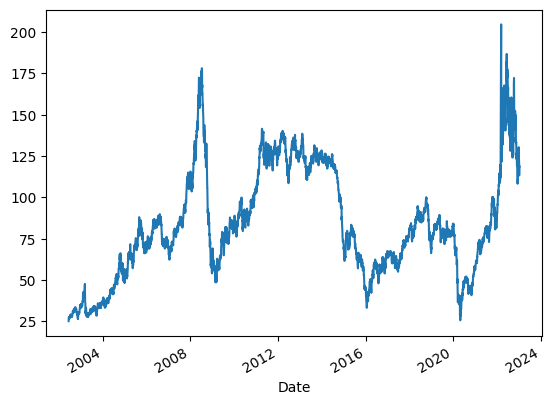

In [15]:
df['GO']['GOC1'].plot()

In [16]:
df['GO'].apply(lambda x: Utilities.adfuller_test(x), axis=0)

,GOC1,GOC2,GOC3,GOC4,GOC5,GOC6,GOC7,GOC8,GOC9,GOC10,GOC11,GOC12
Test Statistic,-2.417075,-2.485147,-2.508421,-2.549998,-2.565181,-2.569378,-2.566515,-2.115924,-2.085676,-2.079972,-2.077739,-2.505684
P-value,0.136975,0.11913,0.113439,0.103778,0.100409,0.099493,0.100117,0.23816,0.250313,0.252644,0.25356,0.114097
Number of lags,31,29,29,29,29,29,29,1,0,0,0,29
Number of observations,5265,5267,5267,5267,5267,5267,5267,5295,5296,5296,5296,5267
Reject (signif. level 0.05),False,False,False,False,False,False,False,False,False,False,False,False
Critical value 1%,-3.431593,-3.431592,-3.431592,-3.431592,-3.431592,-3.431592,-3.431592,-3.431586,-3.431585,-3.431585,-3.431585,-3.431592
Critical value 5%,-2.862089,-2.862089,-2.862089,-2.862089,-2.862089,-2.862089,-2.862089,-2.862086,-2.862086,-2.862086,-2.862086,-2.862089
Critical value 10%,-2.567062,-2.567062,-2.567062,-2.567062,-2.567062,-2.567062,-2.567062,-2.567061,-2.567061,-2.567061,-2.567061,-2.567062


In [17]:
df['RB'].apply(lambda x: Utilities.adfuller_test(x), axis=0)

,RBC1,RBC2,RBC3,RBC4,RBC5,RBC6,RBC7,RBC8,RBC9,RBC10,RBC11,RBC12
Test Statistic,-3.302734,-3.16147,-2.951993,-2.466487,-2.663705,-2.41079,-2.342763,-2.321723,-2.37445,-2.423505,-2.368319,-3.156578
P-value,0.014757,0.022326,0.039627,0.123843,0.080532,0.138714,0.158547,0.165058,0.149078,0.135212,0.150878,0.02264
Number of lags,22,21,20,0,28,4,4,4,4,4,4,29
Number of observations,4406,4407,4408,4428,4400,4424,4424,4424,4424,4424,4424,4399
Reject (signif. level 0.05),True,True,True,False,False,False,False,False,False,False,False,True
Critical value 1%,-3.431835,-3.431835,-3.431834,-3.431828,-3.431837,-3.431829,-3.431829,-3.431829,-3.431829,-3.431829,-3.431829,-3.431837
Critical value 5%,-2.862196,-2.862196,-2.862196,-2.862193,-2.862197,-2.862194,-2.862194,-2.862194,-2.862194,-2.862194,-2.862194,-2.862197
Critical value 10%,-2.567119,-2.567119,-2.567119,-2.567118,-2.56712,-2.567118,-2.567118,-2.567118,-2.567118,-2.567118,-2.567118,-2.56712


In [18]:
df['HO'].apply(lambda x: Utilities.adfuller_test(x), axis=0)

,HOTC1,HOTC2,HOTC3,HOTC4,HOTC5,HOTC6,HOTC7,HOTC8,HOTC9,HOTC10,HOTC11,HOTC12
Test Statistic,-1.666487,-1.769898,-1.851965,-1.885434,-1.888175,-1.87288,-1.845066,-1.802582,-1.751338,-2.685984,-1.586503,-1.532931
P-value,0.448457,0.395505,0.354985,0.338944,0.337644,0.344925,0.358328,0.379181,0.404874,0.076495,0.49037,0.517163
Number of lags,37,38,38,38,38,38,38,38,38,0,38,38
Number of observations,9544,9543,9543,9543,9543,9543,9543,9543,9543,9581,9543,9543
Reject (signif. level 0.05),False,False,False,False,False,False,False,False,False,False,False,False
Critical value 1%,-3.431035,-3.431035,-3.431035,-3.431035,-3.431035,-3.431035,-3.431035,-3.431035,-3.431035,-3.431033,-3.431035,-3.431035
Critical value 5%,-2.861843,-2.861843,-2.861843,-2.861843,-2.861843,-2.861843,-2.861843,-2.861843,-2.861843,-2.861842,-2.861843,-2.861843
Critical value 10%,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931,-2.566931


In [19]:
df['CR'].apply(lambda x: Utilities.adfuller_test(x), axis=0)

,RCLC1,RCLC2,RCLC3,RCLC4,RCLC5,RCLC6,RCLC12,LLCC1,LLCC2,LLCC3,LLCC4,LLCC5,LLCC6,LLCC12
Test Statistic,-2.234133,-2.171901,-2.103791,-2.051821,-2.009993,-1.973176,-1.806805,-2.14199,-2.076664,-2.027749,-1.986677,-1.991105,-1.95642,-1.761602
P-value,0.194091,0.216602,0.242993,0.264323,0.282209,0.298457,0.377088,0.227969,0.254001,0.27454,0.292445,0.290487,0.306002,0.399685
Number of lags,33,29,29,29,29,29,29,32,32,32,32,37,37,32
Number of observations,8662,8666,8666,8666,8666,8666,8666,8663,8663,8663,8663,8658,8658,8663
Reject (signif. level 0.05),False,False,False,False,False,False,False,False,False,False,False,False,False,False
Critical value 1%,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431105,-3.431106,-3.431106,-3.431105
Critical value 5%,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874,-2.861874
Critical value 10%,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948,-2.566948


# Test Granger causation

<AxesSubplot: xlabel='Date'>

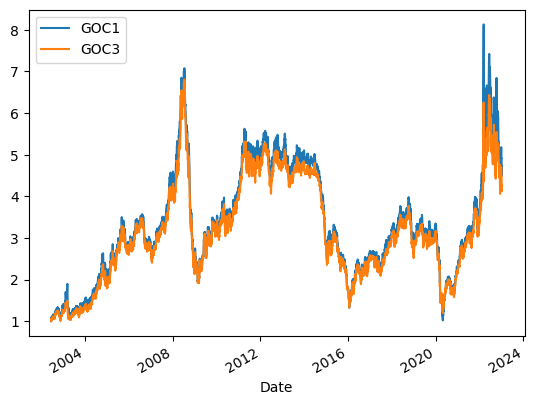

In [20]:
# make pair
dfgr = df['GO'][['GOC1', 'GOC3']]
dfgr = dfgr/dfgr.iloc[0]
dfgr.plot()

In [21]:
# create VAR model
import MyVAR

<AxesSubplot: xlabel='Date'>

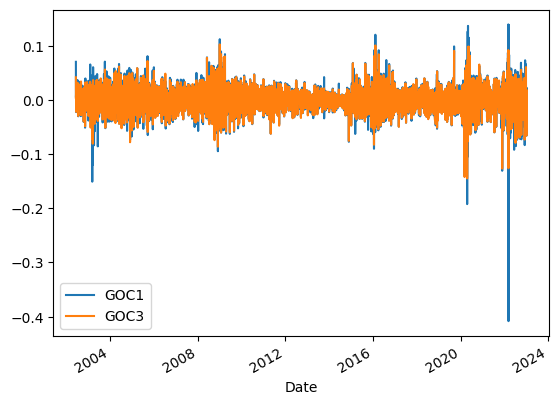

In [22]:
import numpy as np
returns  = np.log(dfgr).diff().dropna()
returns.plot()

In [23]:
# GOC1, GOC3 model VAR Model, where lags of both affect both
VARres = MyVAR.MyVAR(returns.astype(float), 10)
VARres['LR']['df'].head(21)

Estimate           SD of Estimate           t-Statistic          
                 GOC1      GOC3           GOC1      GOC3        GOC1      GOC3
Intercept    0.000242  0.000258       0.000302  0.000269    0.803752  0.960716
GOC1_Lag_1  -0.235199  0.122467       0.033422  0.029785   -7.037219  4.111698
GOC3_Lag_1   0.329672 -0.111028       0.037508  0.033426    8.789319 -3.321581
GOC1_Lag_2  -0.252376  0.010503       0.035567  0.031696   -7.095819  0.331362
GOC3_Lag_2   0.298283 -0.022412       0.040350  0.035959    7.392427 -0.623279
GOC1_Lag_3  -0.188553  0.014927       0.036640  0.032652   -5.146102  0.457146
GOC3_Lag_3   0.233094  0.006327       0.041756  0.037212    5.582310  0.170023
GOC1_Lag_4  -0.253452 -0.086499       0.037229  0.033178   -6.807855 -2.607142
GOC3_Lag_4   0.277883  0.101588       0.042396  0.037782    6.554465  2.688794
GOC1_Lag_5  -0.092563  0.014746       0.037597  0.033506   -2.461965  0.440090
GOC3_Lag_5   0.113512 -0.002881       0.042792  0.038135    2.652617 -0.075555
GOC1_Lag_6  -0.096505 -0.035588       0.037595  0.033503   -2.566994 -1.062228
GOC3_Lag_6   0.072306  0.005543       0.042784  0.038128    1.690013  0.145375
GOC1_Lag_7  -0.036862  0.011638       0.037237  0.033185   -0.989919  0.350691
GOC3_Lag_7   0.031673 -0.009015       0.042496  0.037871    0.745332 -0.238046
GOC1_Lag_8   0.020529  0.021119       0.036640  0.032652    0.560293  0.646779
GOC3_Lag_8  -0.029281 -0.028396       0.041787  0.037239   -0.700719 -0.762521
GOC1_Lag_9   0.054060  0.048831       0.035440  0.031583    1.525389  1.546111
GOC3_Lag_9  -0.057287 -0.037524       0.040500  0.036092   -1.414506 -1.039656
GOC1_Lag_10  0.056949  0.031925       0.033009  0.029417    1.725257  1.085265
GOC3_Lag_10 -0.059978 -0.034419       0.037775  0.033664   -1.587784 -1.022417

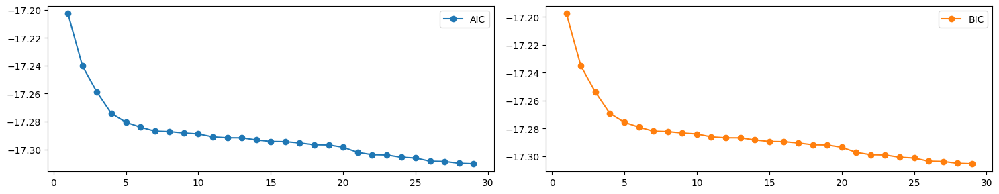

In [24]:
MyVAR.find_VAR_best_lag(returns, 30)

In [25]:
GC = MyVAR.Granger_likelihood_ratio_test(returns, 10, print_res = False)

In [26]:
GC.head()

,GOC1_x,GOC3_x
GOC1_y,1,[True]
GOC3_y,[True],1


In [27]:
Cracks_PairsList0 = LoadEnergyFutures.make_cracks_pairs()

In [28]:
LCOGOC1 = Cracks_PairsList0[1][6]
LCOGOC1.halflife_days()

17.08871368080438

In [29]:
LCOC1 = LCOGOC1.S1()

In [30]:
GOC1 = LCOGOC1.S2()

In [31]:
LCOGOdf = pd.concat([LCOC1, GOC1], axis = 1)
LCOGOdf.columns=['LCOC1','GOC1']

In [32]:
returns  = np.log(LCOGOdf).diff().dropna()
GC1 = MyVAR.Granger_likelihood_ratio_test(returns, 10, print_res = False)
GC1.head()

,LCOC1_x,GOC1_x
LCOC1_y,1,[True]
GOC1_y,[True],1


# Timespread pairs

In [33]:
Timespread_PairsList = LoadEnergyFutures.make_timespread_pairs()

In [34]:
res = LoadEnergyFutures.make_summary_steps_123(Timespread_PairsList)

In [35]:
res.head(len(Timespread_PairsList[0]))

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,GC12,GC21,spr_name
0,29.645524,-9.460986,-9.592433,1,-1.598510,-0.031438,5.892056,0.004833,1.419490,1,1,NG13
1,55.529248,-7.234074,-7.439104,1,-1.131320,0.033330,3.145605,0.000262,1.149841,1,1,NG36
2,52.481980,-7.305646,-7.374208,1,-1.798358,0.039295,3.328249,0.009015,2.434317,1,1,NG16
3,58.912433,-6.875560,-7.794018,1,-1.321990,0.022439,2.964961,-0.001501,2.850090,1,1,NG112
4,21.045126,-7.263050,-8.668638,1,-1.046214,-0.050680,8.299931,-0.000164,0.057297,1,1,RB13
5,61.282684,-5.011020,-4.926925,1,-1.044204,-0.034278,2.850285,0.000275,0.070837,1,1,RB36
6,45.206833,-5.259832,-5.764716,1,-1.084889,-0.078905,3.863865,-0.000137,0.099782,1,1,RB16
7,25.452820,-7.001457,-7.698317,1,-1.131535,-0.158075,6.862622,-0.000107,0.075423,1,1,RB112
8,23.863361,-11.188825,-11.416672,1,-0.970480,0.003725,7.319719,-0.000006,0.077818,1,1,HO13
9,87.411304,-6.198240,-5.633691,1,-0.956286,0.005298,1.998289,-0.000305,0.087522,1,1,HO36


In [32]:
res.sort_values('half_life')

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,spr_name
19,12.324425,-9.510568,-12.195599,1,-1.025733,-0.013312,14.172919,0.000092,0.042160,GO13
4,21.045126,-7.263050,-8.668638,1,-1.046214,-0.050680,8.299931,-0.000164,0.057297,RB13
8,23.863361,-11.188825,-11.416672,1,-0.970480,0.003725,7.319719,-0.000006,0.077818,HO13
7,25.452820,-7.001457,-7.698317,1,-1.131535,-0.158075,6.862622,-0.000107,0.075423,RB112
12,27.494922,-10.666270,-10.853183,1,-0.986743,0.006354,6.352922,-0.000034,0.083071,CL13
16,29.433506,-9.121154,-10.561382,1,-0.994194,0.005071,5.934498,-0.000008,0.064981,LCO13
0,29.645524,-9.460986,-9.592433,1,-1.598510,-0.031438,5.892056,0.004833,1.419490,NG13
17,31.548186,-10.142843,-10.107815,1,-0.988982,0.007636,5.536708,-0.000005,0.069556,LCO36
21,41.878410,-5.842130,-6.806211,1,-1.031123,-0.008917,4.170958,0.000696,0.086157,GO16
18,43.276514,-8.479270,-8.799867,1,-0.981422,0.015058,4.036210,-0.000012,0.129004,LCO16


In [33]:
res.to_excel("C:\\Users\\Julien.Granger\\PycharmProjects\\JupLab\\TSOut.xlsx" )

# Optimize level Z for timespreads

In [34]:
Z_search = Backtest.optimize_Z(Timespread_PairsList[1][19])
Z_search.head(10)

,sharpe,max_dd
0.1,0.707177,-0.069758
0.2,0.506205,-0.131037
0.3,0.370839,-0.150169
0.4,0.508235,-0.095328
0.5,0.512650,-0.069151
0.6,0.451222,-0.069151
0.7,0.402121,-0.069151
0.8,0.452368,-0.034351
0.9,0.413059,-0.034351
1.0,0.465090,-0.034351


In [35]:
import Backtest 
Z_search = Backtest.optimize_Z(Timespread_PairsList[1][4])
Z_search.head(10)

,sharpe,max_dd
0.1,0.745038,-0.061648
0.2,1.162197,-0.039080
0.3,1.188772,-0.039080
0.4,0.972374,-0.046779
0.5,1.116739,-0.031061
0.6,0.968212,-0.031061
0.7,0.793155,-0.031061
0.8,0.621008,-0.019021
0.9,0.467355,-0.009171
1.0,0.428181,-0.009171


In [36]:
Z_search = Backtest.optimize_Z(Timespread_PairsList[1][8])
Z_search.head(10)

,sharpe,max_dd
0.1,0.531607,-0.083065
0.2,0.574317,-0.081810
0.3,0.412960,-0.104350
0.4,0.381578,-0.076535
0.5,0.461194,-0.076535
0.6,0.473410,-0.062183
0.7,0.473106,-0.062183
0.8,0.512963,-0.062183
0.9,0.393057,-0.062183
1.0,0.411033,-0.062183


In [37]:
Z_search = Backtest.optimize_Z(Timespread_PairsList[1][7])
Z_search.head(10)

,sharpe,max_dd
0.1,0.286533,-0.229030
0.2,0.250625,-0.150180
0.3,0.215634,-0.133855
0.4,0.299629,-0.080423
0.5,0.374181,-0.068221
0.6,0.357177,-0.065804
0.7,0.325325,-0.065804
0.8,0.337883,-0.065804
0.9,0.382476,-0.065804
1.0,0.403645,-0.065804


In [38]:
Z_search = Backtest.optimize_Z(Timespread_PairsList[1][12])
Z_search.head(10)

,sharpe,max_dd
0.1,0.896741,-0.802151
0.2,0.721796,-0.922164
0.3,0.751862,-0.901665
0.4,0.935359,-0.713131
0.5,0.942649,-0.713131
0.6,0.987275,-0.470375
0.7,0.730944,-0.470375
0.8,0.725290,-0.253663
0.9,0.669376,-0.191848
1.0,0.300477,-0.163332


# Create plot and tear sheet for some pairs with shortest half life

## RB13

### Without stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2005-10-04
End date,2023-01-10
Total months,210
,Backtest
Annual return,4.9%
Cumulative returns,130.3%
Annual volatility,4.2%
Sharpe ratio,1.16
Calmar ratio,1.24
Stability,0.99
Max drawdown,-3.9%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,3.91,2008-10-07,2008-10-08,2009-03-02,105
1,3.44,2022-05-26,2022-07-28,2022-09-08,76
2,3.15,2012-09-13,2012-09-28,2012-10-12,22
3,3.11,2022-09-12,2022-10-25,2022-11-07,41
4,2.68,2008-08-04,2008-09-16,2008-09-23,37


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


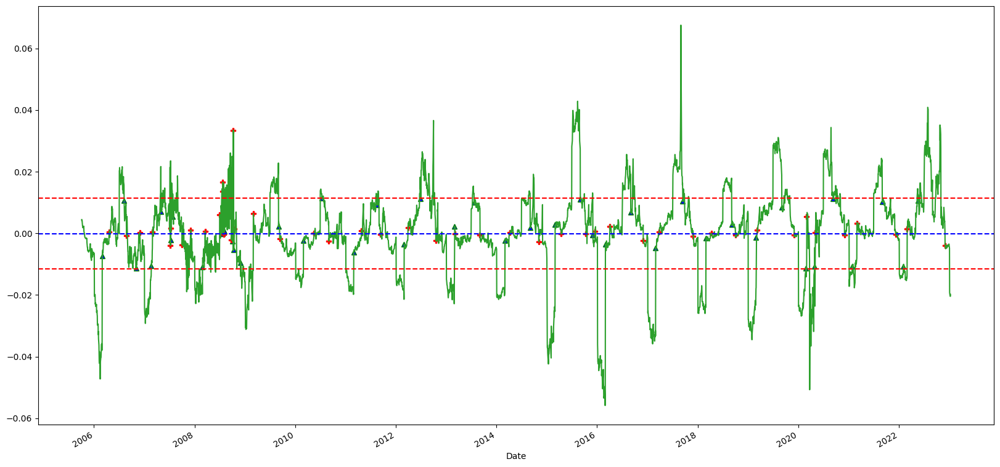

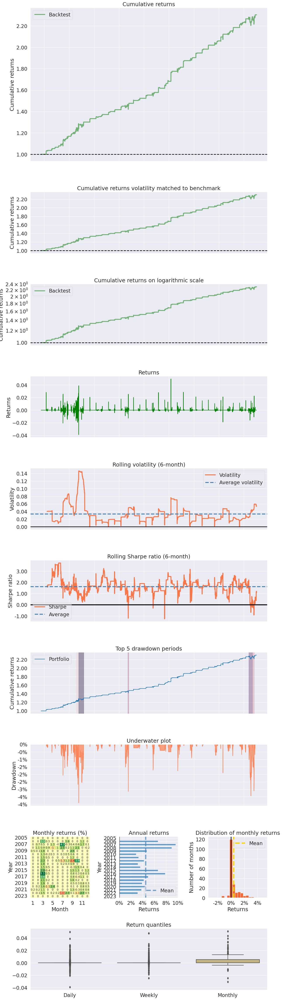

In [41]:
Backtest.plot_results(Timespread_PairsList[1][4], Z = 0.2)

### With stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2005-10-04
End date,2023-01-10
Total months,210
,Backtest
Annual return,4.9%
Cumulative returns,130.3%
Annual volatility,4.2%
Sharpe ratio,1.16
Calmar ratio,1.24
Stability,0.99
Max drawdown,-3.9%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,3.91,2008-10-07,2008-10-08,2009-03-02,105
1,3.44,2022-05-26,2022-07-28,2022-09-08,76
2,3.15,2012-09-13,2012-09-28,2012-10-12,22
3,3.11,2022-09-12,2022-10-25,2022-11-07,41
4,2.68,2008-08-04,2008-09-16,2008-09-23,37


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


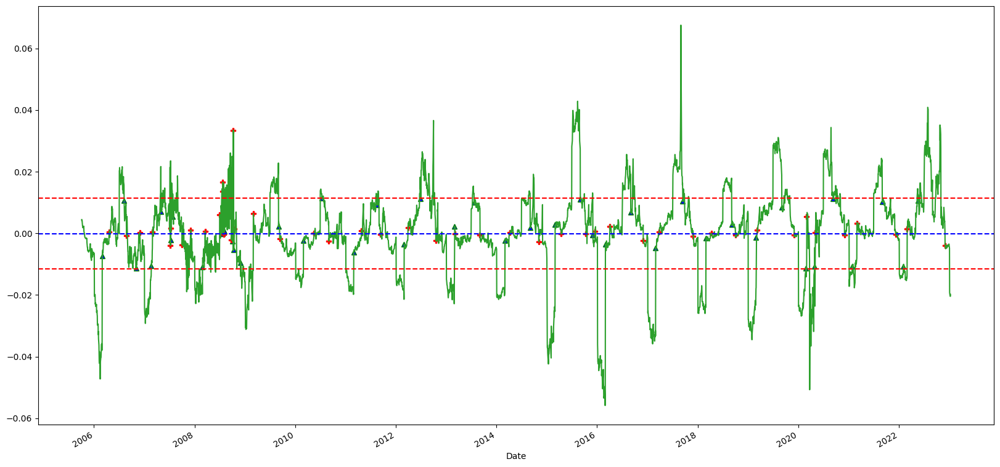

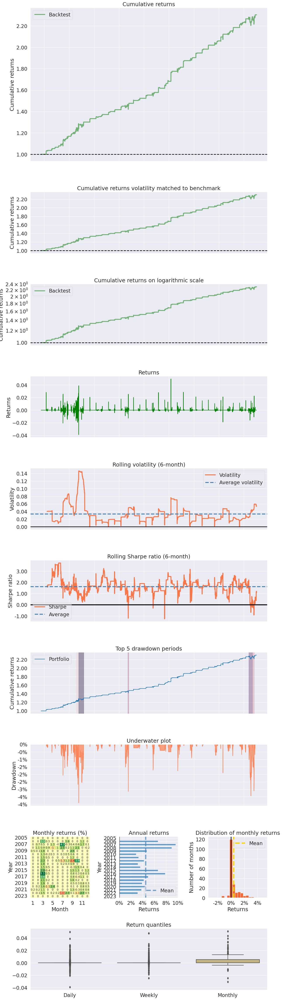

In [42]:
Backtest.plot_results(Timespread_PairsList[1][4], Z = 0.2, use_stop_loss = True)

## GO13

### Without stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,252
,Backtest
Annual return,2.3%
Cumulative returns,60.5%
Annual volatility,3.3%
Sharpe ratio,0.71
Calmar ratio,0.33
Stability,0.99
Max drawdown,-7.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.98,2020-04-28,2020-10-12,2022-10-03,635
1,5.94,2002-11-11,2003-03-07,2003-05-12,131
2,5.79,2022-10-10,2022-12-12,NaT,NaN
3,3.60,2008-12-11,2010-06-10,2011-08-12,697
4,3.04,2016-08-11,2016-12-12,2018-07-13,502


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


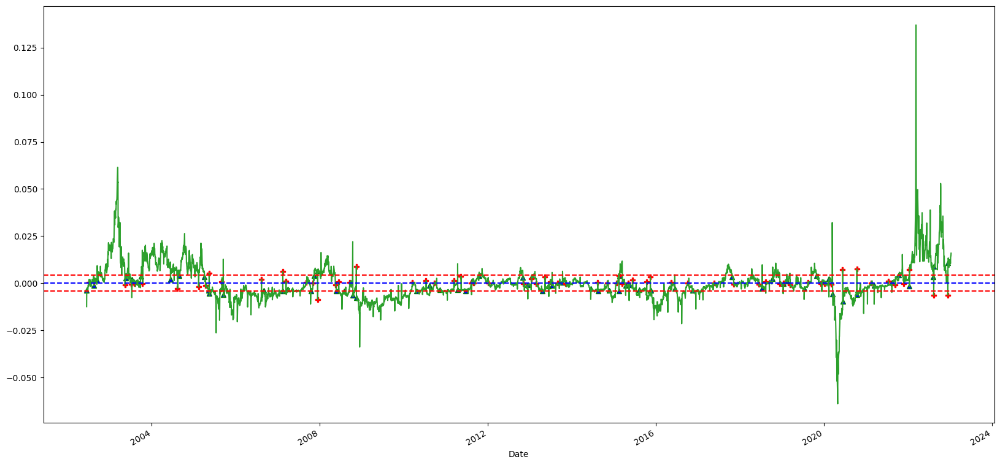

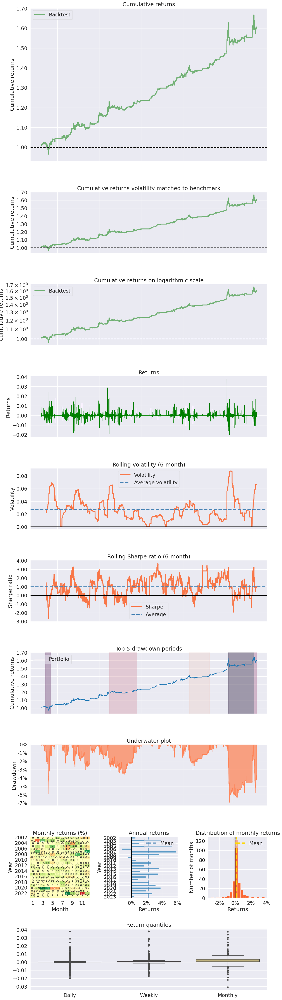

In [43]:
Backtest.plot_results(Timespread_PairsList[1][19], Z = 0.1)

### With stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,252
,Backtest
Annual return,2.3%
Cumulative returns,60.5%
Annual volatility,3.3%
Sharpe ratio,0.71
Calmar ratio,0.33
Stability,0.99
Max drawdown,-7.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.98,2020-04-28,2020-10-12,2022-10-03,635
1,5.94,2002-11-11,2003-03-07,2003-05-12,131
2,5.79,2022-10-10,2022-12-12,NaT,NaN
3,3.60,2008-12-11,2010-06-10,2011-08-12,697
4,3.04,2016-08-11,2016-12-12,2018-07-13,502


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


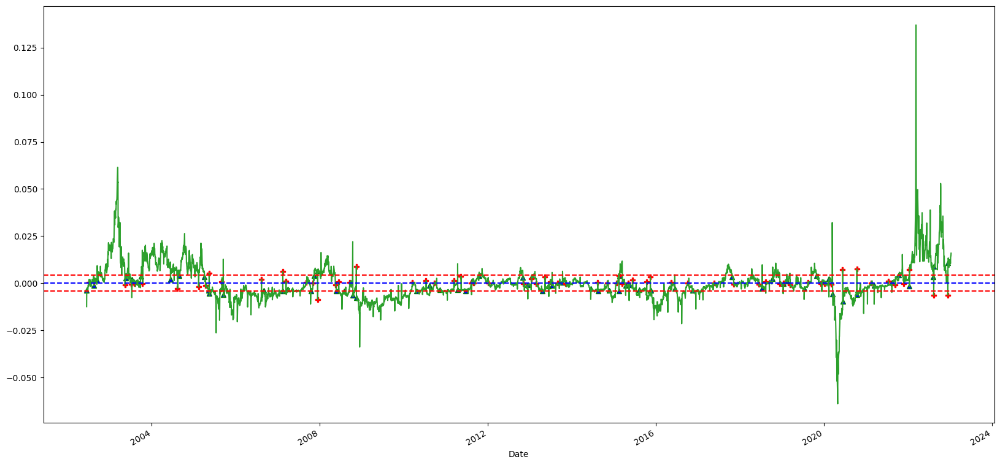

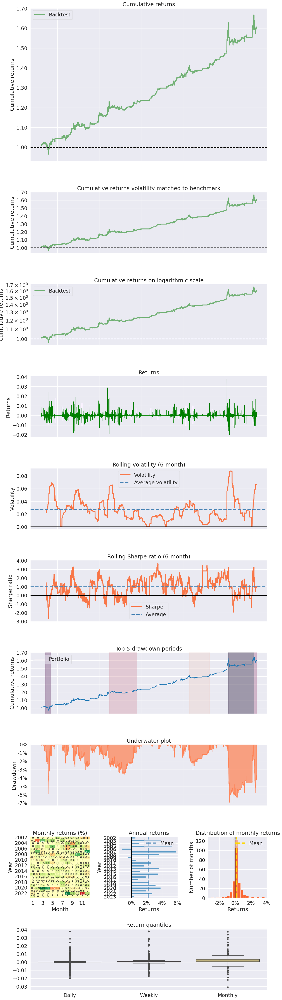

In [44]:
Backtest.plot_results(Timespread_PairsList[1][19], Z = 0.1, use_stop_loss = True)

## RB112

### Without stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2005-10-04
End date,2023-01-10
Total months,210
,Backtest
Annual return,5.3%
Cumulative returns,148.5%
Annual volatility,5.6%
Sharpe ratio,0.96
Calmar ratio,0.53
Stability,0.98
Max drawdown,-10.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.97,2020-03-17,2020-04-21,2020-08-19,112
1,6.40,2021-06-14,2022-06-03,2022-09-01,319
2,5.42,2008-12-05,2009-09-30,2011-03-11,591
3,4.95,2006-08-02,2006-09-08,2006-12-15,98
4,3.91,2007-07-10,2007-07-31,2008-03-11,176


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


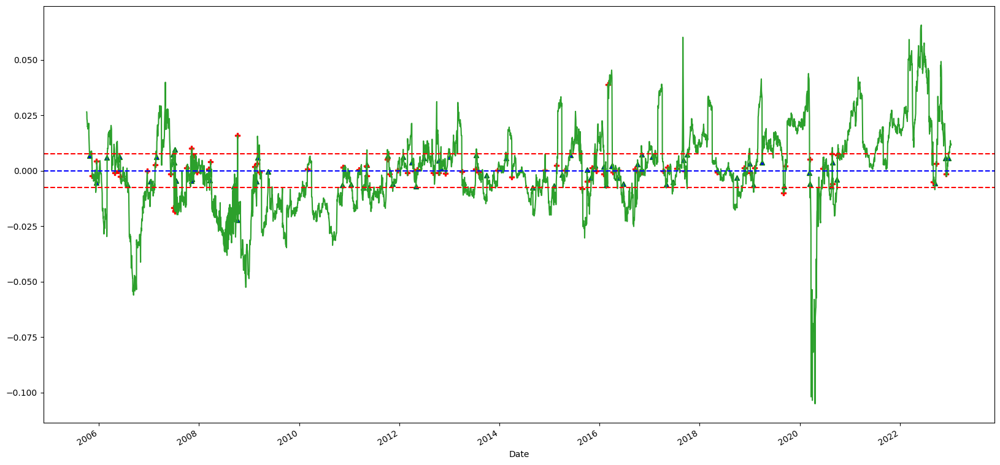

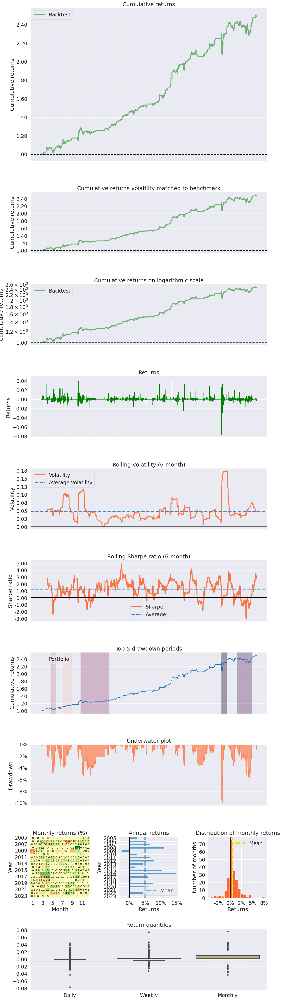

In [101]:
Backtest.plot_results(Timespread_PairsList[1][7], Z = 0.1)

### With stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2005-10-04
End date,2023-01-10
Total months,210
,Backtest
Annual return,5.3%
Cumulative returns,148.5%
Annual volatility,5.6%
Sharpe ratio,0.96
Calmar ratio,0.53
Stability,0.98
Max drawdown,-10.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.97,2020-03-17,2020-04-21,2020-08-19,112
1,6.40,2021-06-14,2022-06-03,2022-09-01,319
2,5.42,2008-12-05,2009-09-30,2011-03-11,591
3,4.95,2006-08-02,2006-09-08,2006-12-15,98
4,3.91,2007-07-10,2007-07-31,2008-03-11,176


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


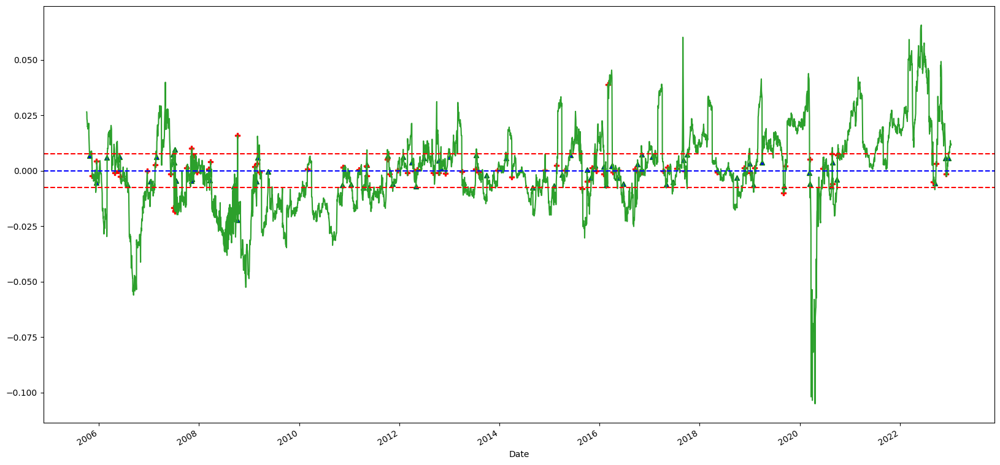

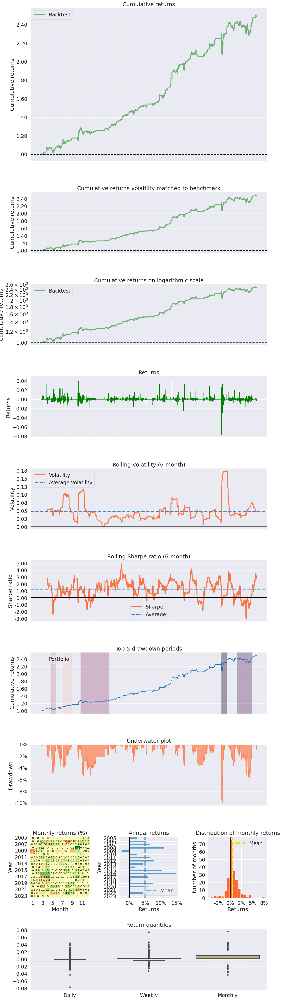

In [102]:
Backtest.plot_results(Timespread_PairsList[1][7], Z = 0.1, use_stop_loss = True)

## CL13

### Without stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,1989-08-11
End date,2023-01-10
Total months,414
,Backtest
Annual return,1.6%
Cumulative returns,73.7%
Annual volatility,4.1%
Sharpe ratio,0.41
Calmar ratio,0.09
Stability,0.93
Max drawdown,-18.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,17.96,2020-03-19,2020-04-21,2020-05-15,42
1,5.52,1996-02-23,1996-04-17,1996-07-19,106
2,5.27,2015-06-02,2016-02-11,2017-11-21,646
3,4.62,1998-05-27,1998-06-15,1998-07-10,33
4,4.10,1998-05-12,1998-05-19,1998-05-26,11


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


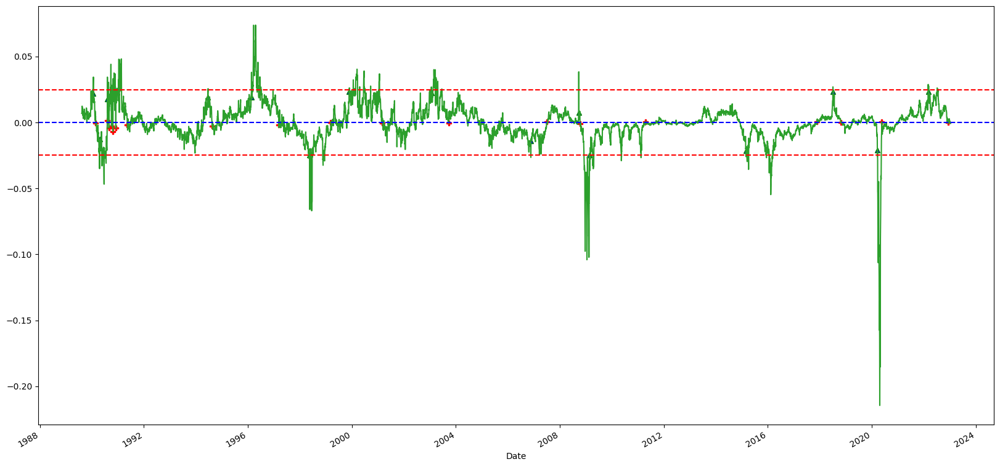

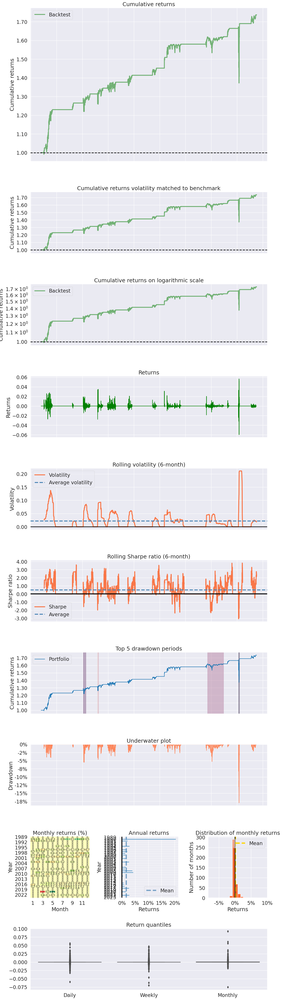

In [47]:
Backtest.plot_results(Timespread_PairsList[1][12], Z = 0.3)

### With stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,1989-08-11
End date,2023-01-10
Total months,414
,Backtest
Annual return,1.3%
Cumulative returns,58.4%
Annual volatility,4.7%
Sharpe ratio,0.31
Calmar ratio,0.07
Stability,0.92
Max drawdown,-19.1%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.06,2020-03-10,2020-04-21,2020-06-02,61
1,9.74,2008-11-20,2009-01-15,2013-07-22,1218
2,6.97,1995-10-23,1996-04-17,1997-03-10,361
3,6.20,1997-11-21,1998-06-15,1999-03-10,339
4,5.50,1990-10-22,1991-02-15,1992-04-01,378


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


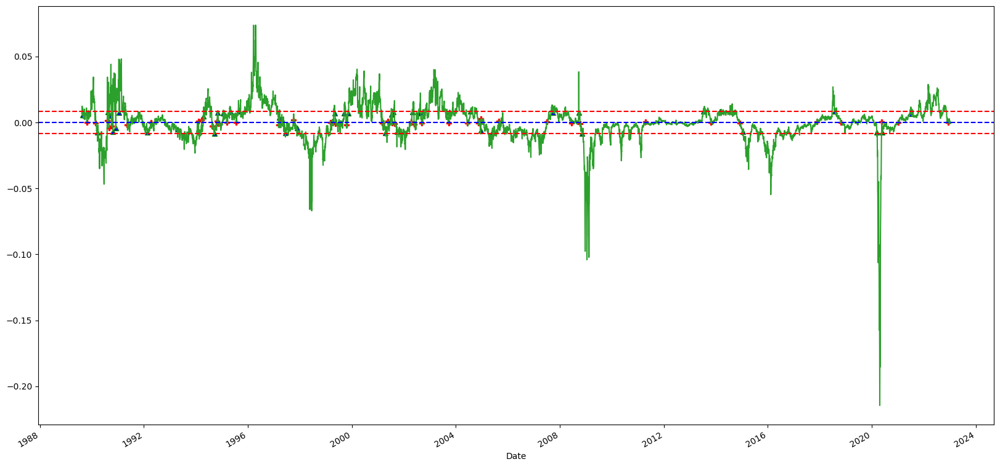

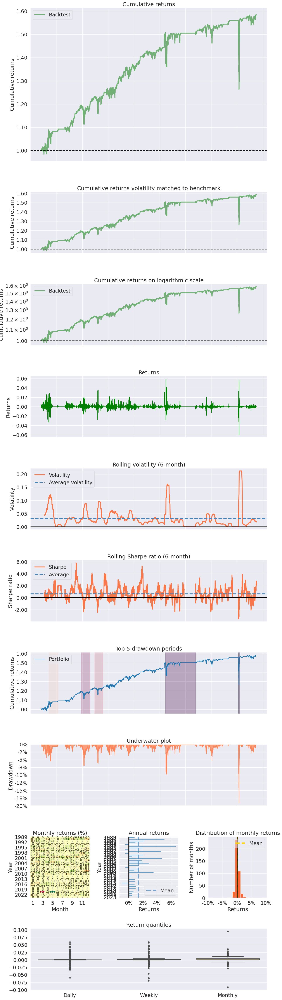

In [105]:
Backtest.plot_results(Timespread_PairsList[1][12], Z = 0.1, use_stop_loss = True)

## HO13

In [49]:
ho13 = Timespread_PairsList[1][8]
ho13.halflife_days()

23.863360588436738

In [50]:
ho13.Step1_ADF_tstat()

-11.188825055098372

In [51]:
ho13.Step2_ec_tstat()

s1_diff   -11.416672
Name: residuals_s1s2_shifted, dtype: float64

<AxesSubplot: xlabel='Date'>

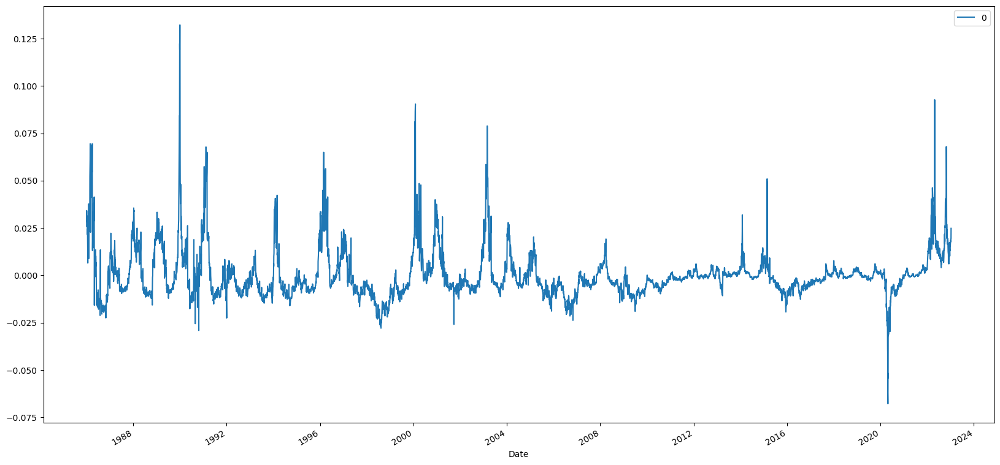

In [52]:
ho13.S1s2().plot()

### Without stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,1986-01-02
End date,2023-01-10
Total months,456
,Backtest
Annual return,2.0%
Cumulative returns,114.5%
Annual volatility,3.6%
Sharpe ratio,0.57
Calmar ratio,0.25
Stability,0.91
Max drawdown,-8.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.18,2022-02-22,2022-04-28,2022-08-05,119
1,6.81,2003-01-01,2003-02-28,2003-04-02,66
2,6.34,1986-01-20,1986-03-31,1986-05-01,74
3,6.22,2022-08-08,2022-10-28,NaT,NaN
4,5.18,1996-01-25,1996-02-27,1996-05-15,80


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


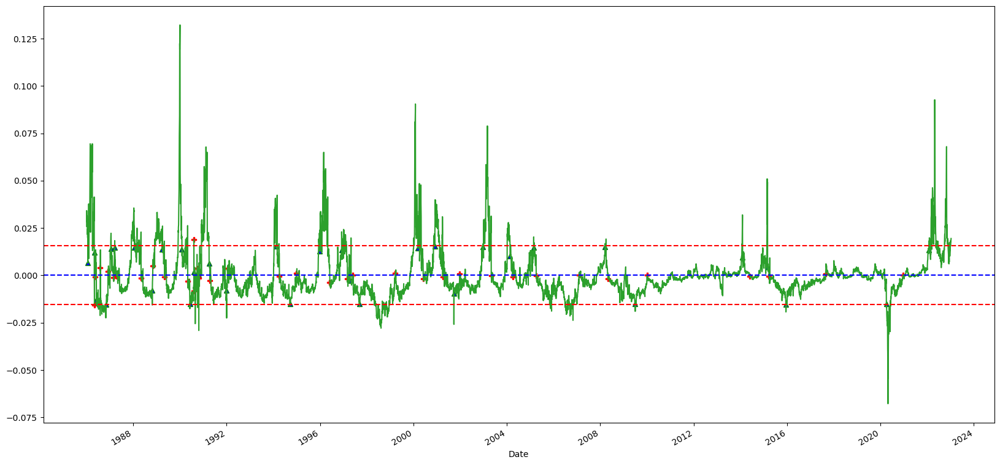

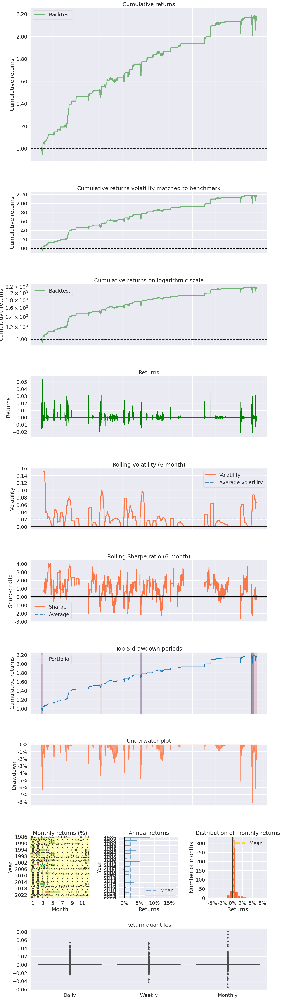

In [106]:
Backtest.plot_results(Timespread_PairsList[1][8], Z = 0.2)

### With stop loss

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,1986-01-02
End date,2023-01-10
Total months,456
,Backtest
Annual return,2.0%
Cumulative returns,114.5%
Annual volatility,3.6%
Sharpe ratio,0.57
Calmar ratio,0.25
Stability,0.91
Max drawdown,-8.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.18,2022-02-22,2022-04-28,2022-08-05,119
1,6.81,2003-01-01,2003-02-28,2003-04-02,66
2,6.34,1986-01-20,1986-03-31,1986-05-01,74
3,6.22,2022-08-08,2022-10-28,NaT,NaN
4,5.18,1996-01-25,1996-02-27,1996-05-15,80


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


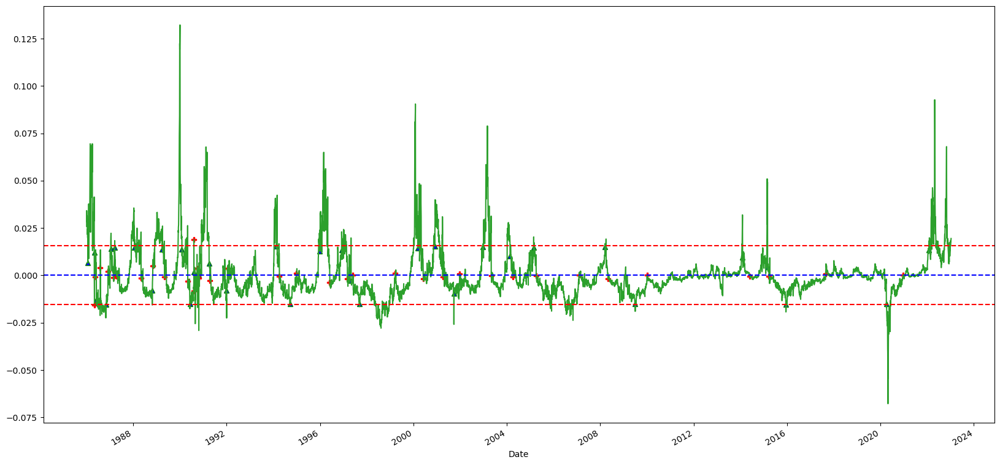

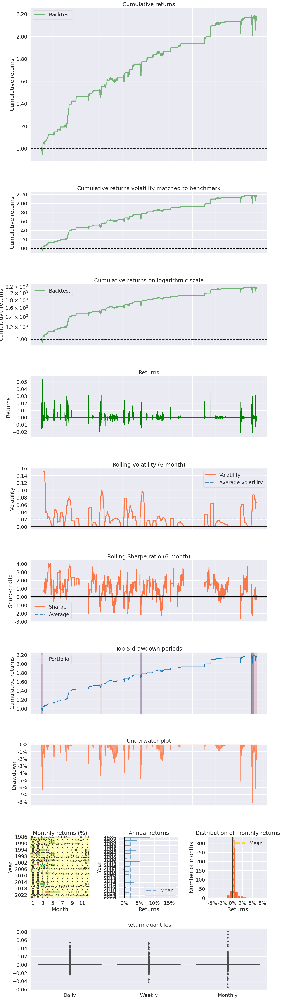

In [107]:
Backtest.plot_results(Timespread_PairsList[1][8], Z = 0.2, use_stop_loss = True)

# Crack pairs

In [108]:
Cracks_PairsList = LoadEnergyFutures.make_cracks_pairs()

In [109]:
res = LoadEnergyFutures.make_summary_steps_123(Cracks_PairsList)

In [110]:
res.head(len(Cracks_PairsList[0]))

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,spr_name
0,40.192152,-8.795252,-7.867808,1,-0.961479,0.034473,4.345950,-0.000665,0.189880,CLHOC1
1,76.490641,-5.711298,-6.275469,1,-0.986700,0.023996,2.283588,-0.000755,0.159501,CLHOC3
2,100.412835,-4.748678,-5.499867,1,-0.998855,0.015086,1.739549,-0.000662,0.144809,CLHOC6
3,29.464593,-7.212692,-7.161045,1,-1.048323,-0.053509,5.928237,-0.000164,0.106290,CLRBC1
4,60.674384,-4.980725,-5.193088,1,-1.045765,-0.052179,2.878861,-0.000756,0.095314,CLRBC3
5,80.354816,-4.131253,-4.079214,1,-1.070674,-0.066796,2.173773,-0.000637,0.085568,CLRBC6
6,17.088714,-7.830367,-6.788033,1,-1.003463,-0.030441,10.221547,-0.000436,0.103436,LCOGOC1
7,18.025428,-6.596016,-7.645006,1,-1.015613,-0.033517,9.690371,-0.000337,0.084311,LCOGOC3
8,15.644511,-6.816778,-8.534728,1,-1.031176,-0.039804,11.165136,-0.000169,0.071062,LCOGOC6


In [111]:
res.sort_values('half_life')

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,spr_name
8,15.644511,-6.816778,-8.534728,1,-1.031176,-0.039804,11.165136,-0.000169,0.071062,LCOGOC6
6,17.088714,-7.830367,-6.788033,1,-1.003463,-0.030441,10.221547,-0.000436,0.103436,LCOGOC1
7,18.025428,-6.596016,-7.645006,1,-1.015613,-0.033517,9.690371,-0.000337,0.084311,LCOGOC3
3,29.464593,-7.212692,-7.161045,1,-1.048323,-0.053509,5.928237,-0.000164,0.106290,CLRBC1
0,40.192152,-8.795252,-7.867808,1,-0.961479,0.034473,4.345950,-0.000665,0.189880,CLHOC1
4,60.674384,-4.980725,-5.193088,1,-1.045765,-0.052179,2.878861,-0.000756,0.095314,CLRBC3
1,76.490641,-5.711298,-6.275469,1,-0.986700,0.023996,2.283588,-0.000755,0.159501,CLHOC3
5,80.354816,-4.131253,-4.079214,1,-1.070674,-0.066796,2.173773,-0.000637,0.085568,CLRBC6
2,100.412835,-4.748678,-5.499867,1,-0.998855,0.015086,1.739549,-0.000662,0.144809,CLHOC6


In [112]:
res.to_excel("C:\\Users\\Julien.Granger\\PycharmProjects\\JupLab\\CxOut.xlsx" )

In [113]:
Z_search = Backtest.optimize_Z(Cracks_PairsList[1][8])
Z_search.head(10)

,sharpe,max_dd
0.1,0.857504,-0.073980
0.2,0.470422,-0.073980
0.3,0.440551,-0.073980
0.4,0.336854,-0.073980
0.5,0.226507,-0.073980
0.6,0.182502,-0.037837
0.7,0.050959,-0.037837
0.8,0.091670,-0.037837
0.9,0.123018,-0.037837
1.0,0.123018,-0.037837


In [114]:
Z_search = Backtest.optimize_Z(Cracks_PairsList[1][7])
Z_search.head(10)

,sharpe,max_dd
0.1,0.824456,-0.089392
0.2,0.484945,-0.089392
0.3,0.559667,-0.089392
0.4,0.458586,-0.089392
0.5,0.279565,-0.089392
0.6,0.111528,-0.089392
0.7,0.144108,-0.052414
0.8,0.039036,-0.052414
0.9,0.071443,-0.052414
1.0,0.082200,-0.052414


In [115]:
Z_search = Backtest.optimize_Z(Cracks_PairsList[1][6])
Z_search.head(10)

,sharpe,max_dd
0.1,0.799438,-0.123819
0.2,0.606878,-0.123819
0.3,0.491975,-0.123819
0.4,0.422031,-0.123819
0.5,0.307030,-0.123819
0.6,0.266637,-0.123819
0.7,0.285515,-0.123819
0.8,0.257757,-0.123819
0.9,0.196226,-0.123819
1.0,0.196226,-0.123819


In [116]:
Z_search = Backtest.optimize_Z(Cracks_PairsList[1][3])
Z_search.head(10)

,sharpe,max_dd
0.1,0.746972,-0.094875
0.2,0.784111,-0.094875
0.3,1.010776,-0.085761
0.4,0.829628,-0.076932
0.5,0.762380,-0.068449
0.6,0.812378,-0.064360
0.7,0.689433,-0.077136
0.8,0.625681,-0.077136
0.9,0.548610,-0.077136
1.0,0.409596,-0.077136


C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,252
,Backtest
Annual return,5.3%
Cumulative returns,195.2%
Annual volatility,6.2%
Sharpe ratio,0.86
Calmar ratio,0.71
Stability,0.96
Max drawdown,-7.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,7.40,2022-03-11,2022-10-12,NaT,NaN
1,4.56,2009-01-20,2009-02-18,2009-03-13,39
2,4.50,2008-09-25,2008-11-20,2008-12-31,70
3,4.27,2009-03-30,2009-11-25,2014-12-01,1481
4,3.89,2018-07-12,2018-12-24,2020-04-02,451


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


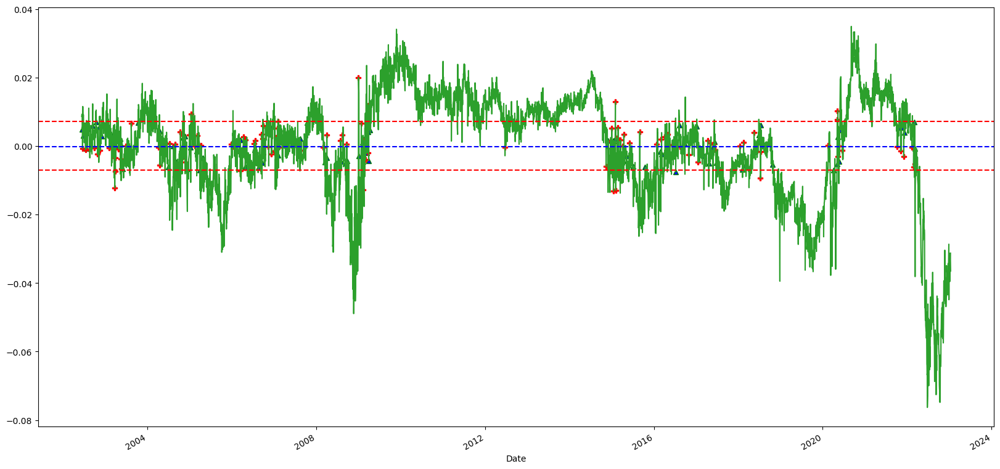

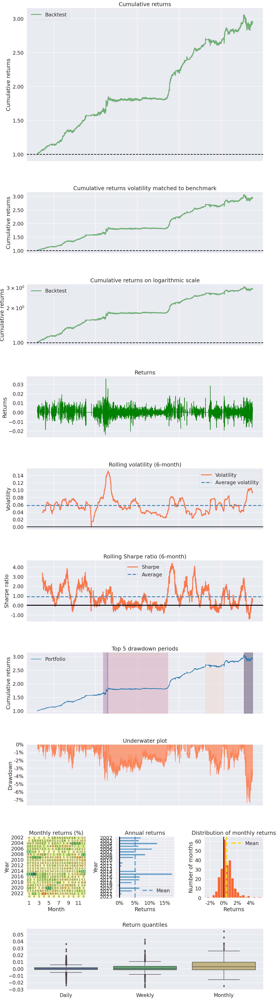

In [117]:
Backtest.plot_results(Cracks_PairsList[1][8], use_stop_loss = True, Z = 0.1)

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,252
,Backtest
Annual return,5.6%
Cumulative returns,216.1%
Annual volatility,6.9%
Sharpe ratio,0.82
Calmar ratio,0.63
Stability,0.94
Max drawdown,-8.9%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.94,2022-03-11,2022-09-07,NaT,NaN
1,6.10,2008-09-19,2008-12-04,2008-12-31,74
2,5.30,2009-01-07,2009-01-23,2009-03-30,59
3,4.18,2018-07-12,2018-12-24,2019-05-29,230
4,4.03,2020-04-14,2020-04-21,2020-05-01,14


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


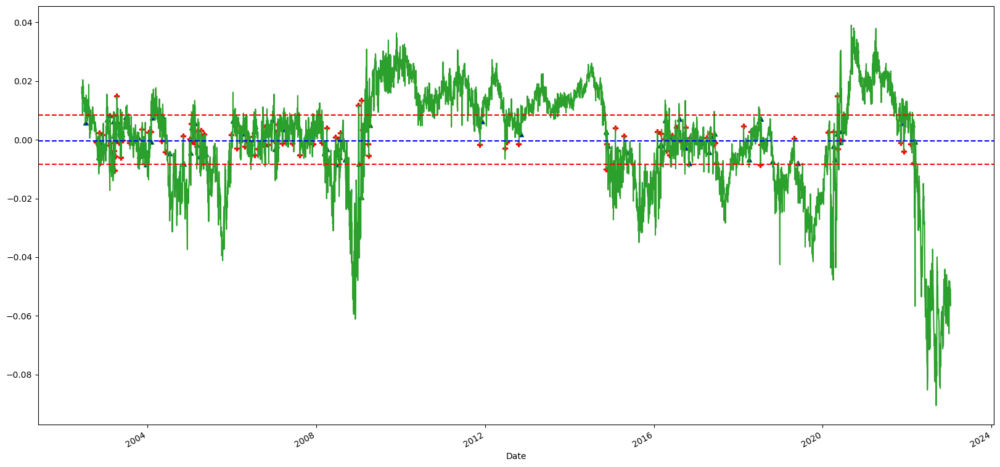

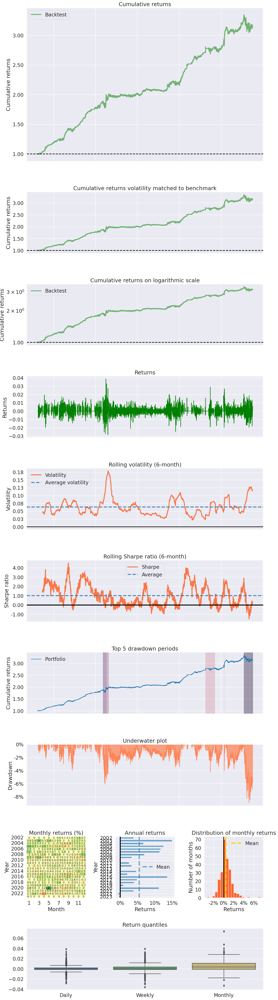

In [118]:
Backtest.plot_results(Cracks_PairsList[1][7], use_stop_loss = True, Z = 0.1)

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,252
,Backtest
Annual return,6.7%
Cumulative returns,293.3%
Annual volatility,8.6%
Sharpe ratio,0.80
Calmar ratio,0.54
Stability,0.95
Max drawdown,-12.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,12.38,2022-03-11,2022-10-10,NaT,NaN
1,8.02,2008-09-22,2008-11-12,2009-01-23,90
2,6.85,2009-11-25,2012-03-01,2012-10-17,756
3,5.60,2020-06-04,2021-11-26,2022-03-11,462
4,5.16,2004-08-27,2004-12-10,2005-01-07,96


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


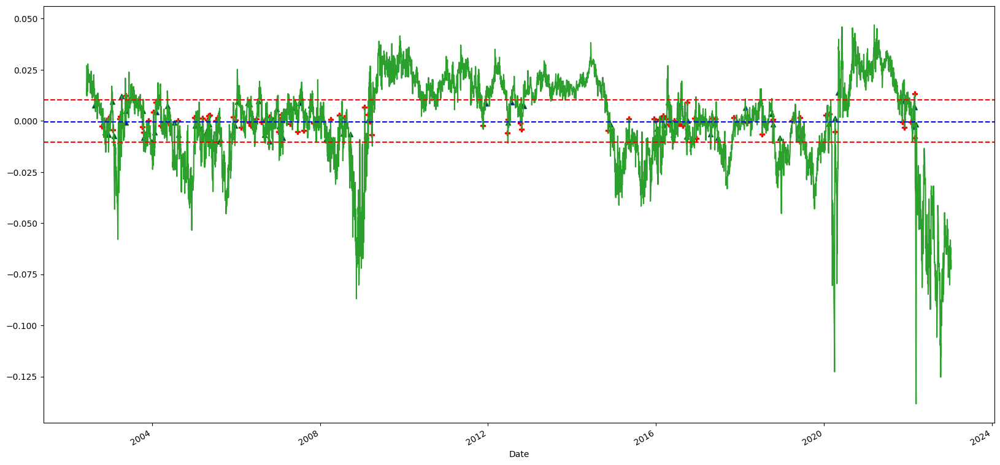

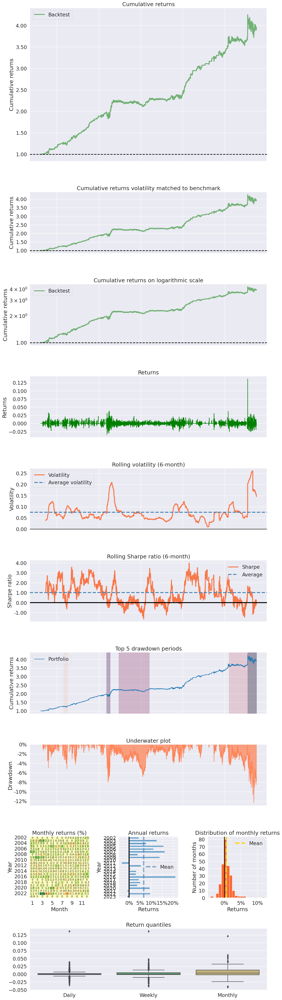

In [119]:
Backtest.plot_results(Cracks_PairsList[1][6], use_stop_loss = True, Z = 0.1)

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2005-10-04
End date,2023-01-10
Total months,210
,Backtest
Annual return,4.9%
Cumulative returns,130.9%
Annual volatility,6.7%
Sharpe ratio,0.75
Calmar ratio,0.51
Stability,0.97
Max drawdown,-9.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.49,2008-11-20,2009-01-13,2009-03-06,77
1,7.38,2015-02-17,2015-08-12,2015-09-16,152
2,6.49,2015-11-16,2016-03-15,2016-09-22,224
3,5.46,2020-03-18,2020-04-03,2020-05-28,52
4,5.00,2007-03-06,2007-05-11,2007-07-02,85


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


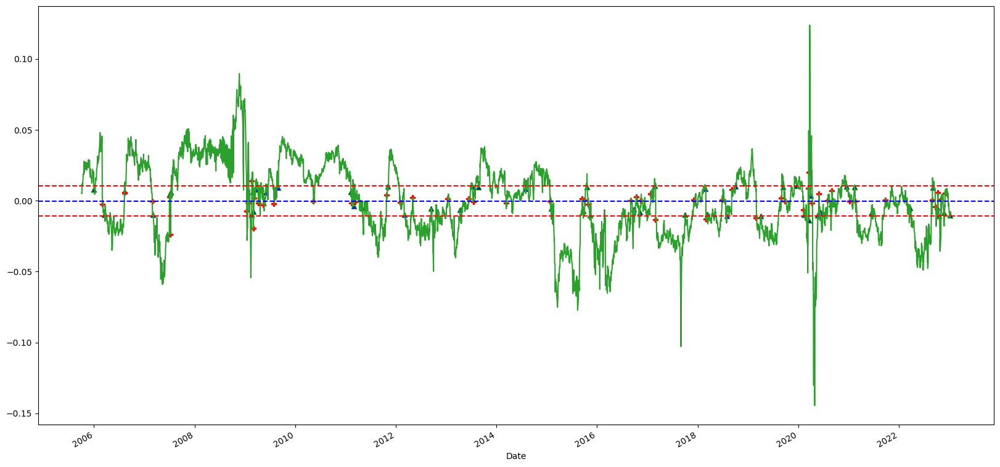

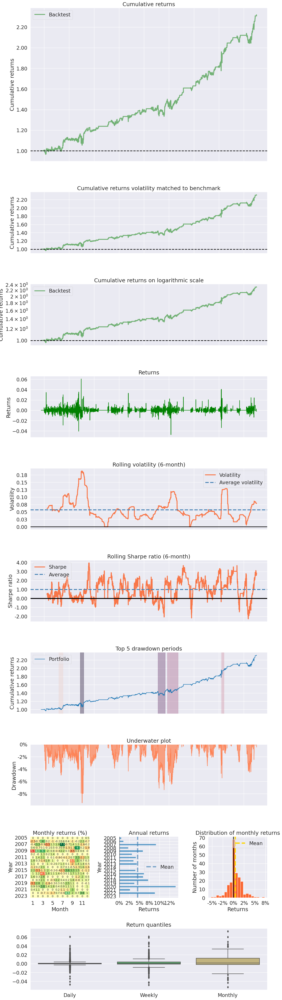

In [120]:
Backtest.plot_results(Cracks_PairsList[1][3], use_stop_loss = True, Z = 0.1)

# Locational Pairs

In [121]:
Location_PairsList = LoadEnergyFutures.make_locational_pairs()

In [122]:
res = LoadEnergyFutures.make_summary_steps_123(Location_PairsList)

In [123]:
res.head(len(Location_PairsList[0]))

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,spr_name
0,29.597899,-9.571493,-10.405076,1,-0.877843,0.117171,5.901537,-0.000032,0.128039,CL1LCO2
1,34.242918,-7.633716,-9.684789,1,-0.880288,0.116113,5.100999,-0.000025,0.101368,CL3LCO4
2,5.214113,-13.206937,-14.356528,1,-0.943510,0.056639,33.500057,0.000022,0.050395,HO2GO1
3,5.713652,-11.145701,-14.703227,1,-0.958299,0.045716,30.571183,0.000017,0.042330,HO4GO3
4,7.063710,-9.759557,-12.688384,1,-0.962890,0.038870,24.728236,0.000041,0.042935,HO7GO6


In [124]:
res.sort_values('half_life')

,half_life,step1_ADF_tstat,step2_ec_tstat,1,b_2,b_0,OU_theta,OU_mu,OU_sigma_eq,spr_name
2,5.214113,-13.206937,-14.356528,1,-0.943510,0.056639,33.500057,0.000022,0.050395,HO2GO1
3,5.713652,-11.145701,-14.703227,1,-0.958299,0.045716,30.571183,0.000017,0.042330,HO4GO3
4,7.063710,-9.759557,-12.688384,1,-0.962890,0.038870,24.728236,0.000041,0.042935,HO7GO6
0,29.597899,-9.571493,-10.405076,1,-0.877843,0.117171,5.901537,-0.000032,0.128039,CL1LCO2
1,34.242918,-7.633716,-9.684789,1,-0.880288,0.116113,5.100999,-0.000025,0.101368,CL3LCO4


In [125]:
Z_search = Backtest.optimize_Z(Location_PairsList[1][4])
Z_search.head(10)

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(


,sharpe,max_dd
0.1,0.952742,-0.040095
0.2,0.777313,-0.034180
0.3,0.541271,-0.033150
0.4,0.437083,-0.033150
0.5,0.360209,-0.033150
0.6,0.266412,-0.029140
0.7,0.268630,-0.017143
0.8,NaN,0.000000
0.9,NaN,0.000000
1.0,NaN,0.000000


In [126]:
Z_search = Backtest.optimize_Z(Location_PairsList[1][3])
Z_search.head(10)

,sharpe,max_dd
0.1,1.121993,-0.045009
0.2,0.944024,-0.041995
0.3,0.780513,-0.040876
0.4,0.626522,-0.036373
0.5,0.537768,-0.036373
0.6,0.487916,-0.033233
0.7,0.361784,-0.033233
0.8,0.318520,-0.025322
0.9,0.318520,-0.025322
1.0,0.187081,-0.025322


In [127]:
Z_search = Backtest.optimize_Z(Location_PairsList[1][2])
Z_search.head(10)

,sharpe,max_dd
0.1,1.209593,-0.145181
0.2,1.068029,-0.056006
0.3,0.972759,-0.064166
0.4,0.698949,-0.057721
0.5,0.666960,-0.040881
0.6,0.518118,-0.025392
0.7,0.398047,-0.023667
0.8,0.325022,-0.022022
0.9,0.325022,-0.022022
1.0,0.330479,-0.022022


C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,249
,Backtest
Annual return,5.5%
Cumulative returns,203.6%
Annual volatility,5.8%
Sharpe ratio,0.95
Calmar ratio,1.37
Stability,0.96
Max drawdown,-4.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,4.01,2020-02-26,2021-05-19,2022-03-10,532
1,3.66,2016-02-24,2016-08-04,2018-04-24,565
2,3.49,2009-01-20,2009-04-20,2009-06-25,113
3,3.28,2008-09-01,2008-12-24,2008-12-31,88
4,3.10,2002-06-26,2002-10-01,2003-03-26,196


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


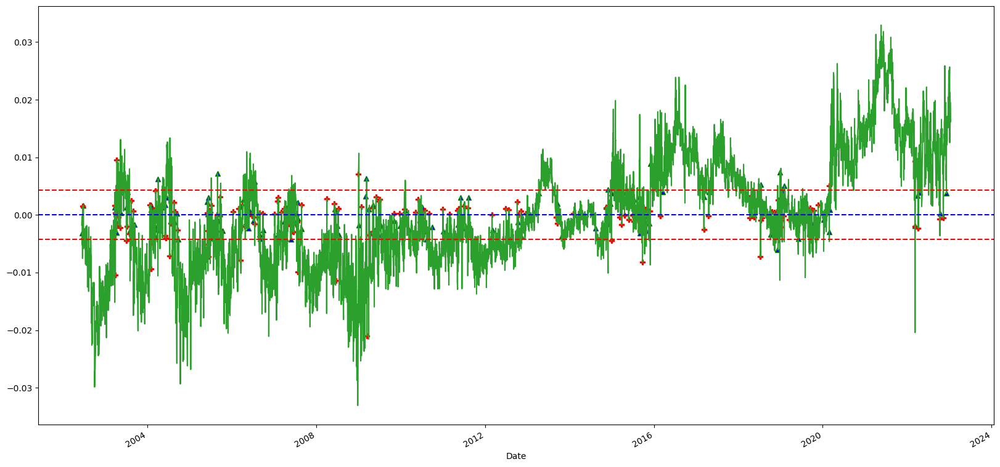

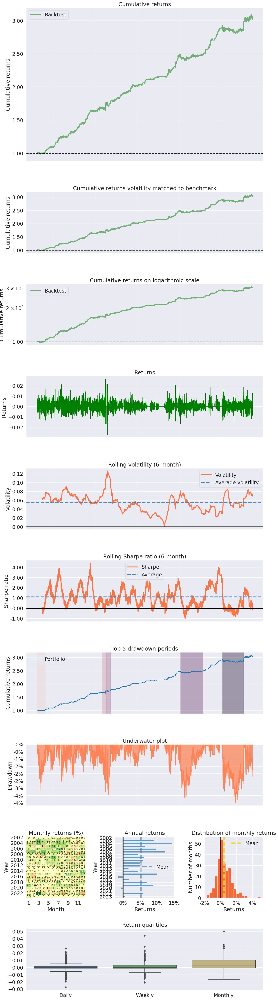

In [128]:
Backtest.plot_results(Location_PairsList[1][4], use_stop_loss = True, Z = 0.1)

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,249
,Backtest
Annual return,7.1%
Cumulative returns,315.3%
Annual volatility,6.3%
Sharpe ratio,1.12
Calmar ratio,1.57
Stability,0.96
Max drawdown,-4.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,4.50,2022-03-09,2022-03-11,2022-05-31,60
1,4.20,2002-10-30,2003-02-10,2003-04-11,118
2,3.80,2009-02-23,2009-05-15,2009-06-25,89
3,3.32,2020-06-23,2021-05-19,2022-03-01,441
4,3.16,2022-07-29,2022-11-21,2023-01-03,113


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


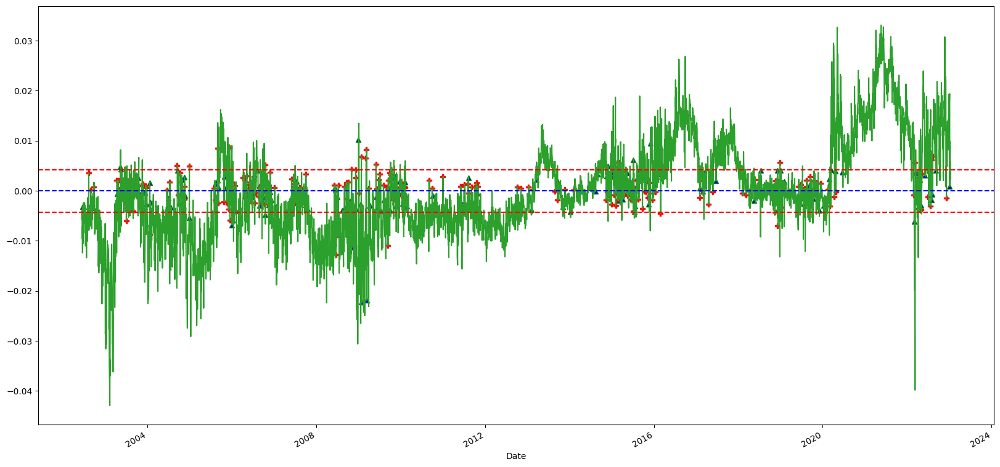

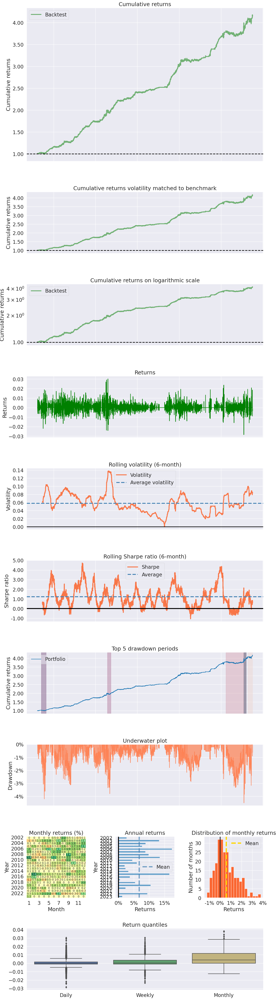

In [129]:
Backtest.plot_results(Location_PairsList[1][3], use_stop_loss = True, Z = 0.1)

C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:339: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in open_positions], [df1['spread'][i] for i in open_positions],
C:\Users\Julien.Granger\PycharmProjects\JupLab\Backtest.py:341: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date([df1['spread'].index[i] for i in closed_positions], [df1['spread'][i] for i in closed_positions],
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()


Start date,2002-06-13
End date,2023-01-10
Total months,249
,Backtest
Annual return,9.2%
Cumulative returns,528.5%
Annual volatility,7.5%
Sharpe ratio,1.21
Calmar ratio,0.64
Stability,0.98
Max drawdown,-14.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.52,2022-03-10,2022-04-04,2022-11-11,177
1,5.25,2008-07-17,2008-10-10,2008-11-13,86
2,3.94,2009-01-23,2009-02-10,2009-03-09,32
3,3.70,2020-08-13,2021-05-12,2022-02-09,390
4,3.31,2022-11-21,2023-01-06,NaT,NaN


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


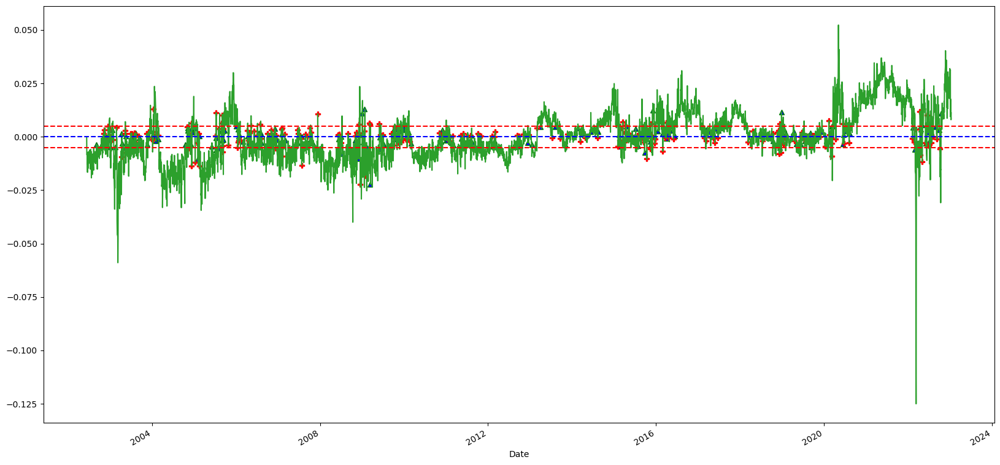

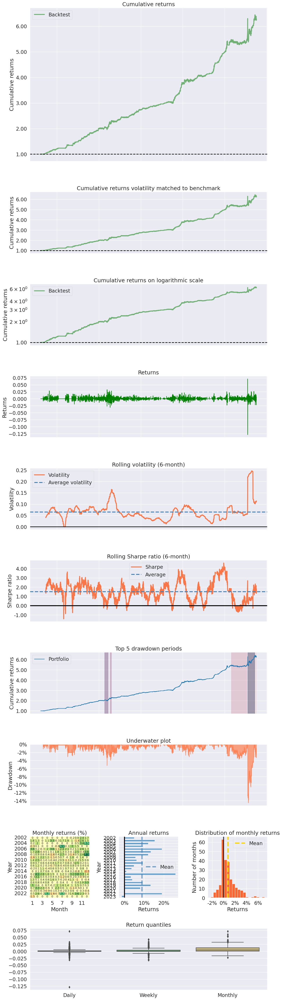

In [130]:
Backtest.plot_results(Location_PairsList[1][2], use_stop_loss = True, Z = 0.1)

# Rolling out-of-sample spread backtesting

## Timespread

In [131]:
s1 = df['GO']['GOC1']

In [132]:
s2 = df['GO']['GOC3']

In [133]:
dfsel = df['GO']
col1 = 'GOC1'
col2 = 'GOC3'

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:1527: RuntimeWarning: divide by zero encountered in double_scalars
  return np.abs(np.percentile(returns, 95)) / \


Start date,2005-07-08
End date,2022-10-05
Total months,212
,Backtest
Annual return,35.8%
Cumulative returns,22194.4%
Annual volatility,74.2%
Sharpe ratio,0.62
Calmar ratio,0.72
Stability,0.92
Max drawdown,-49.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,49.40,2022-07-12,2022-07-13,NaT,NaN
1,39.32,2008-10-10,2011-05-12,2011-11-17,810
2,38.69,2022-03-24,2022-03-29,2022-06-13,58
3,34.06,2020-03-12,2022-02-07,2022-03-11,522
4,17.77,2008-07-10,2008-07-11,2008-08-12,24


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


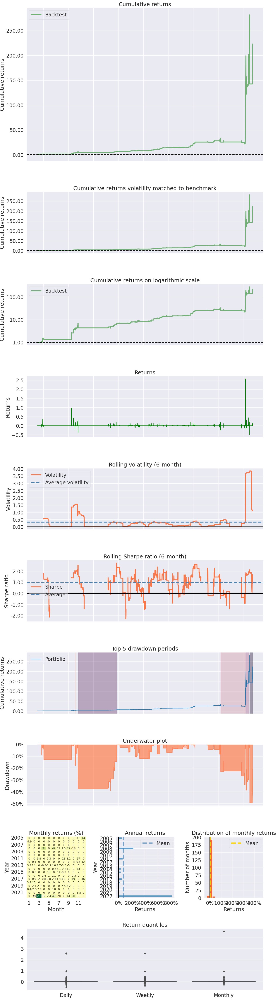

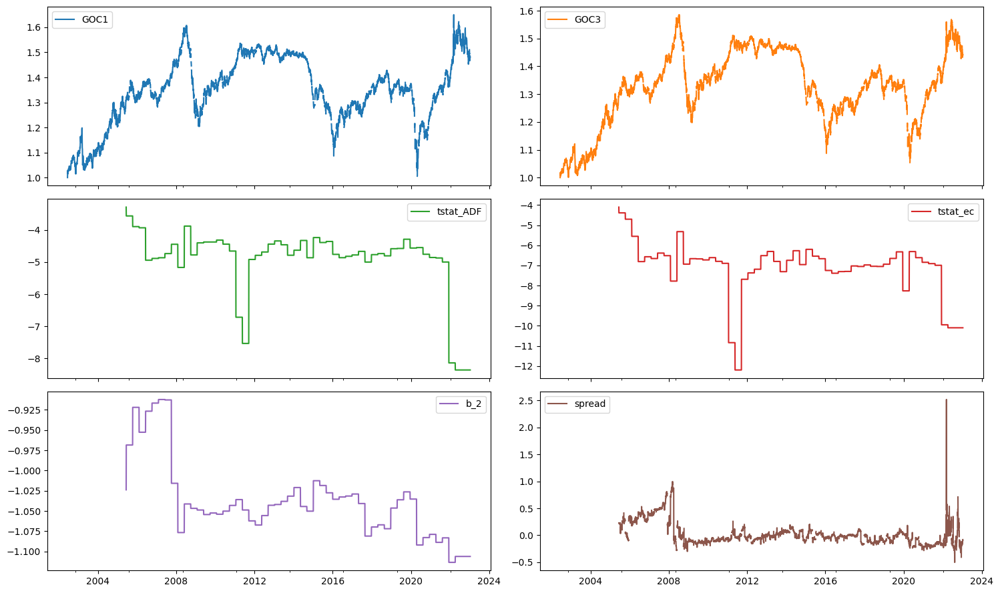

In [134]:
Backtest.rolling_oos_backtesting_plots(dfsel, col1, col2, Z = 0.3)

## Crack

In [135]:
dfcrho = pd.concat([df['CR']['RCLC1'],df['CR']['RCLC3'],df['CR']['RCLC6'], df['HO']['HOTC1'], df['HO']['HOTC3'], df['HO']['HOTC6']], axis=1)
dfcrho.dropna(inplace=True)

In [136]:
dfcrgo = pd.concat([df['CR']['LLCC1'], df['CR']['LLCC3'], df['CR']['LLCC6'], df['GO']['GOC1'], df['GO']['GOC3'], df['GO']['GOC6']],
        axis=1)
dfcrgo.dropna(inplace=True)

In [137]:
dfsel = dfcrgo
col1 = 'LLCC3'
col2 = 'GOC3'

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:1527: RuntimeWarning: invalid value encountered in double_scalars
  return np.abs(np.percentile(returns, 95)) / \


Start date,2005-07-08
End date,2022-10-05
Total months,211
,Backtest
Annual return,22.8%
Cumulative returns,3688.9%
Annual volatility,36.0%
Sharpe ratio,0.72
Calmar ratio,0.95
Stability,0.85
Max drawdown,-24.1%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,24.07,2009-11-23,2010-06-17,2010-11-18,259
1,22.10,2009-03-12,2009-05-07,2009-06-03,60
2,19.08,2012-06-21,2012-08-17,2013-03-13,190
3,17.76,2011-06-15,2011-06-16,2011-07-20,26
4,14.56,2013-05-15,2014-07-11,2020-10-12,1934


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


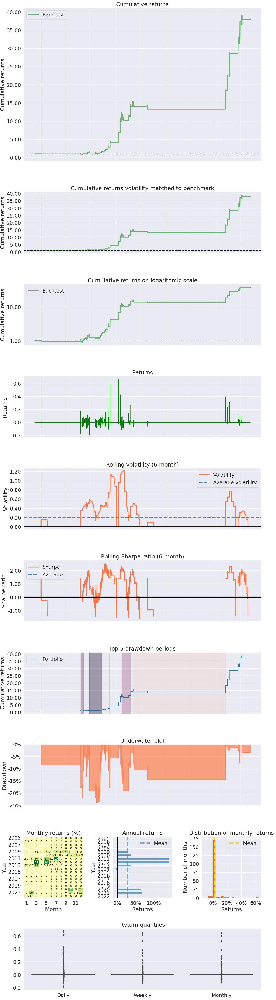

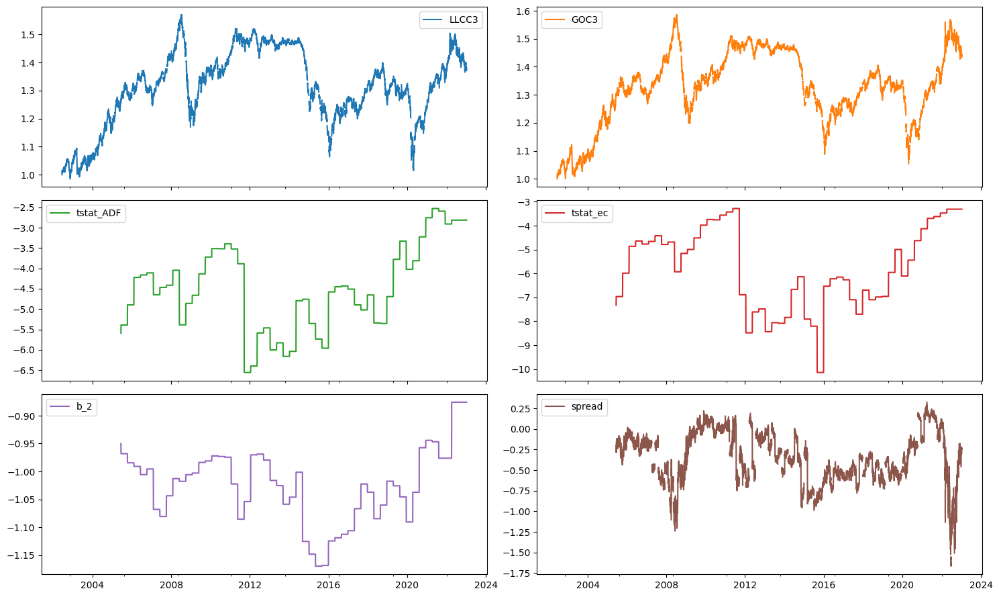

In [138]:
Backtest.rolling_oos_backtesting_plots(dfsel, col1, col2, Z = 0.2)

## Locational pair

In [139]:
dfhogo = pd.concat([df['HO']['HOTC2'],df['HO']['HOTC4'],df['HO']['HOTC7'], df['GO']['GOC1'], df['GO']['GOC3'], df['GO']['GOC6']], axis=1)
dfhogo.dropna(inplace=True)

In [140]:
dfsel = dfhogo
col1 = 'HOTC2'
col2 = 'GOC1'

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\timeseries.py:724: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = pd.Series()
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:447: RuntimeWarning: invalid value encountered in double_scalars
  return ending_value ** (1 / num_years) - 1
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:447: RuntimeWarning: invalid value encountered in double_scalars
  return ending_value ** (1 / num_years) - 1
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:1494: RuntimeWarning: invalid value encountered in log1p
  cum_log_returns = np.log1p(returns).cumsum()
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:1527: RuntimeWarning: invalid value encountered in double_scalars
  re

Start date,2005-07-08
End date,2022-10-05
Total months,209
,Backtest
Annual return,nan%
Cumulative returns,-32923.7%
Annual volatility,90.8%
Sharpe ratio,0.37
Calmar ratio,NaN
Stability,NaN
Max drawdown,-1230.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,1230.52,2022-03-10,2022-06-06,NaT,NaN
1,59.28,2008-04-02,2008-10-13,2010-10-20,666
2,25.34,2013-03-11,2013-04-10,2013-09-09,131
3,25.14,2007-12-12,2007-12-13,2008-04-01,80
4,23.57,2005-08-26,2005-09-13,2006-01-16,102


c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\pyfolio\plotting.py:805: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  oos_cum_returns = pd.Series([])


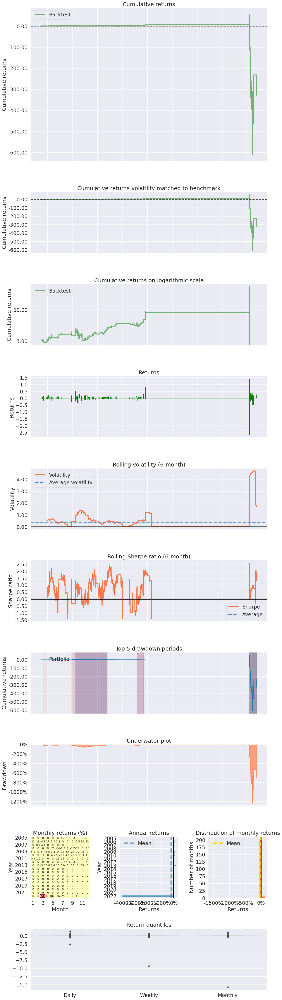

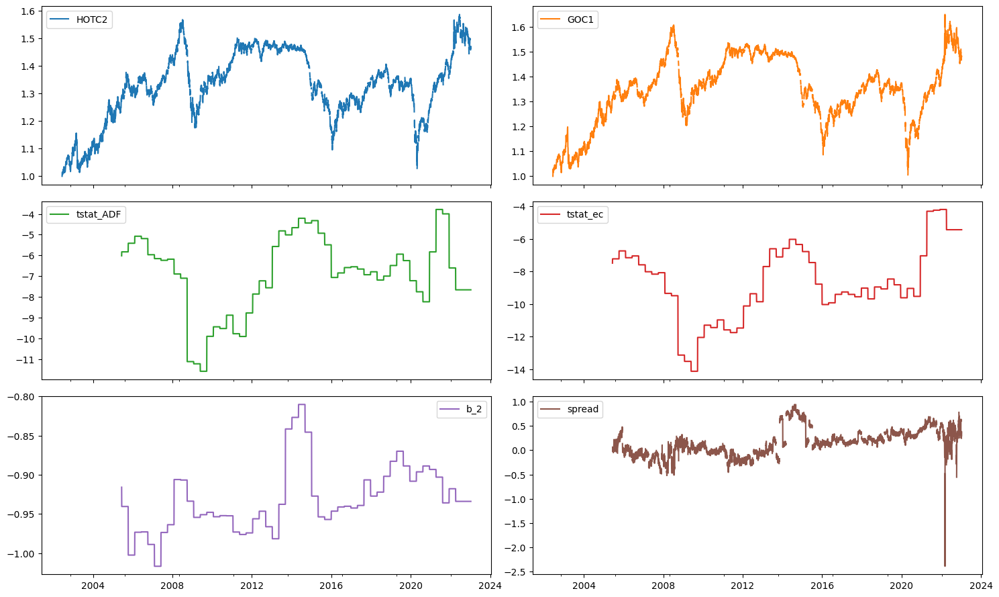

In [141]:
Backtest.rolling_oos_backtesting_plots(dfsel, col1, col2, Z = 0.2)

# Look at NG - HO

In [142]:
df['NG'] = df['NG'][~df['NG'].index.duplicated(keep='first')]

In [143]:
dfngho = pd.concat([df['NG']['NNGC1'], df['HO']['HOTC1']], axis = 1)
dfngho.dropna(inplace = True)
dfngho.describe().T

,count,mean,std,min,25%,50%,75%,max
NNGC1,8379.0,3.841035,2.225178,1.0750,2.2570,3.0370,4.7725,15.3780
HOTC1,8379.0,63.171763,39.671386,12.3984,25.8426,59.0268,86.9736,215.6868


In [144]:
dfngho.head()

,NNGC1,HOTC1
Date,,
1990-08-13,1.465,31.5210
1990-08-14,1.448,30.6474
1990-08-15,1.428,30.5970
1990-08-16,1.430,31.6974
1990-08-17,1.440,33.8268


In [145]:
import Utilities

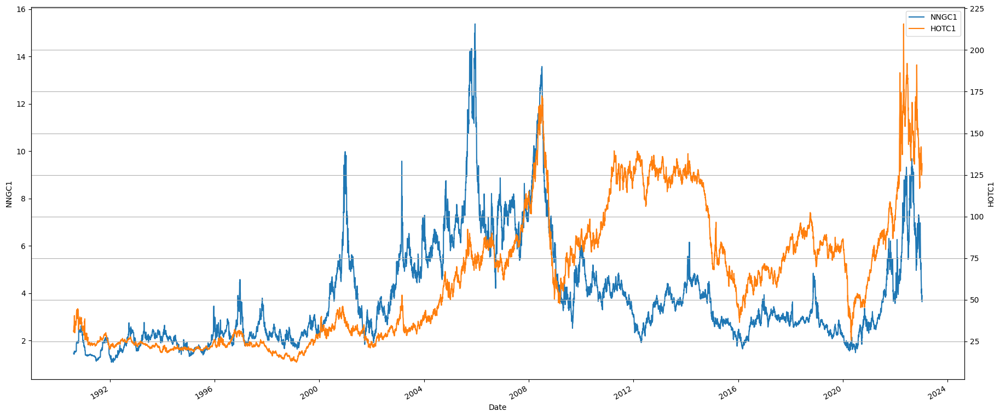

In [146]:
Utilities.plot_multi(dfngho, figsize=(22, 10))
plt.grid()

In [147]:
import MyPair
nghoc1 = MyPair.MyPair(dfngho['NNGC1'], dfngho['HOTC1'])
nghoc1.halflife_days()

200.58428037845255

In [148]:
nghoc1.Step1_ADF_tstat()

-3.6967345319163

In [149]:
nghoc1.Step2_ec_tstat()

s1_diff   -3.804278
Name: residuals_s1s2_shifted, dtype: float64

<AxesSubplot: xlabel='Date'>

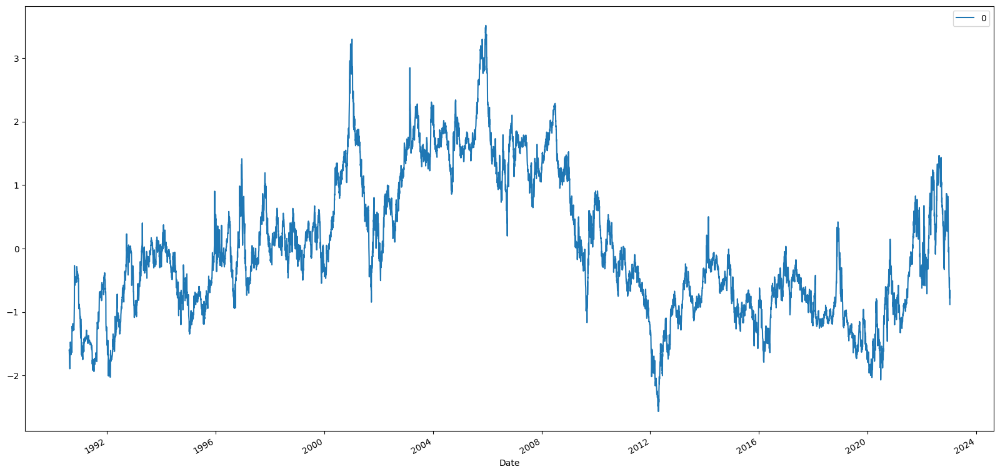

In [150]:
nghoc1.S1s2().plot()

In [151]:
Z_search = Backtest.optimize_Z(nghoc1)

c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(
c:\users\julien.granger\pycharmprojects\test1\lib\site-packages\empyrical\stats.py:710: RuntimeWarning: invalid value encountered in divide
  np.divide(


In [152]:
Z_search.head(10)

,sharpe,max_dd
0.1,0.596387,-0.999926
0.2,0.499301,-0.999529
0.3,0.376972,-0.996154
0.4,0.362059,-0.996154
0.5,0.377138,-0.975436
0.6,NaN,0.000000
0.7,NaN,0.000000
0.8,NaN,0.000000
0.9,NaN,0.000000
1.0,NaN,0.000000
